In [ ]:
!pip install plotly-express wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 61.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 31.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.6/289.6 kB 35.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 10.3 MB/s eta 0:00:00


In [ ]:
!pip install -U kaleido

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.1 MB/s eta 0:00:00


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
from pathlib import Path

import plotly
import plotly.io as pio
pio.renderers.default = 'colab'
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

import pandas as pd
import numpy as np

In [ ]:
from huggingface_hub import login
from google.colab import userdata
import wandb

login(token=userdata.get('HF_TOKEN'))
wandb.login(key=userdata.get('WANDB_API_KEY'))

The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: write).
Your token has been saved to /root/.cache/huggingface/token
Login successful


wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!cp /content/drive/MyDrive/Colab\ Notebooks/Master\ Thesis/Results/all_metrics.xlsx .
!cp /content/drive/MyDrive/Colab\ Notebooks/Master\ Thesis/Results/per_category_iou_metrics.xlsx .
!cp /content/drive/MyDrive/Colab\ Notebooks/Master\ Thesis/Results/per_category_acc_metrics.xlsx .

###**All Metrics**

In [ ]:
all_metrics = pd.read_excel("all_metrics.xlsx")
all_metrics

,Wandb Run Name,Architecture,Type,Tag,Notes,test_mean_iou,test_mean_accuracy,test_overall_accuracy,test_f1_score,test_ece,...,test_aurc,test_eurc,test_dice,test_mean_entropy,test_mean_epistemic_uncertainty,test_loss,pred_mean_entropy,pred_mean_epistemic_uncertainty,pred_mean_entropy_robust,pred_mean_epistemic_uncertainty_robust
0,trim-sun-145,Unet_Resnet101,baseline_50_5,normal,baseline,0.783822,0.788165,0.873576,0.873380,0.022152,...,0.030995,0.022642,0.637525,0.317516,0.029323,0.803829,0.293057,0.026558,0.278968,0.028461
1,misunderstood_water_175,Unet_Resnet101,baseline_50_5,normal,baseline_OHEM,0.778710,0.780377,0.870300,0.869839,0.008866,...,0.032421,0.023620,0.628024,0.373605,0.027721,0.753649,0.353388,0.024569,0.355834,0.029009
2,fine-lion-149,Unet_Resnet101,baseline_50_5,normal,baseline_IW,0.732386,0.831809,0.830576,0.837758,0.024714,...,0.053260,0.038020,0.559210,0.474376,0.041329,1.167641,0.548321,0.037577,0.404298,0.040269
3,sweet-water-199,Unet_Resnet101,baseline_50_5,normal,baseline_IW_OHEM,0.736910,0.832669,0.833330,0.840375,0.019691,...,0.050571,0.035838,0.563251,0.456773,0.040725,1.146434,0.513824,0.040588,0.385457,0.037863
4,morning-smoke-206,Unet_Resnet101,baseline_50_5,normal,baseline_TempScaling,0.783822,0.788165,0.873576,0.873380,0.047870,...,0.031057,0.022705,0.637525,0.560837,0.029022,0.678915,0.531625,0.026143,0.535673,0.029333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,golden-deluge-299,FPN_MIT_B3,MCD_OHEM,robustness,rain,0.559915,0.535959,0.686699,0.691617,0.149963,...,0.154523,0.099324,0.438496,0.551566,0.053892,2.026110,NaN,NaN,NaN,NaN
107,restful-water-300,FPN_MIT_B3,MCD_OHEM,robustness,snow,0.721139,0.747878,0.831867,0.830961,0.048300,...,0.053260,0.038258,0.600530,0.399004,0.043917,1.165008,NaN,NaN,NaN,NaN
108,sleek-hill-301,FPN_MIT_B3,MCD_OHEM,robustness,sunflare,0.722210,0.771164,0.832905,0.833762,0.060412,...,0.056342,0.041531,0.613714,0.353123,0.040485,1.274452,NaN,NaN,NaN,NaN
109,curious-forest-302,FPN_MIT_B3,MCD_OHEM,robustness,shadow,0.781965,0.811605,0.873033,0.872665,0.028869,...,0.032138,0.023713,0.648919,0.327014,0.036384,0.830123,NaN,NaN,NaN,NaN


In [ ]:
all_metrics["Architecture"].value_counts()

Architecture
Unet_Resnet101    79
FPN_MIT_B3        32
Name: count, dtype: int64

In [ ]:
all_metrics["Tag"].value_counts()

Tag
robustness       84
normal           21
miscellaneous     6
Name: count, dtype: int64

In [ ]:
all_metrics["Type"].value_counts()

Type
mcdropout_50_5      16
baseline            14
baseline_OHEM       14
MCD                 14
MCD_OHEM            14
baseline_50_5        9
MCD_ENT              7
MCD_ENT_OHEM         7
ENTDECOMP            7
ENTDECOMP_OHEM       7
baseline_200_10      1
mcdropout_200_10     1
Name: count, dtype: int64

In [ ]:
all_metrics["Notes"].value_counts()

Notes
salt_and_pepper               12
shadow                        12
sunflare                      12
snow                          12
rain                          12
fog                           12
colorjitter                   12
baseline_OHEM                  2
baseline                       2
MCD                            2
MCD_OHEM                       2
MCD_ENT                        1
unnorm_ENTDECOMP               1
baseline_IW                    1
baseline_IW_OHEM               1
baseline_TempScaling           1
MCD_IW                         1
MCD_200                        1
Baseline_200                   1
MCD_BALWGHT_NOIMPATTN          1
MCD_ENT_OHEM                   1
Baseline_BALWGHT_NOIMPATTN     1
Baseline_CUSTOMWGHT            1
ENTDECOMP_IW_OHEM              1
MCD_IW_OHEM                    1
ENTDECOMP_OHEM                 1
ENTDECOMP                      1
MCD_ENT_ IW_OHEM               1
MCD_ENT_IW                     1
ENTDECOMP_IW                   1
Name

In [ ]:
ur101_all = all_metrics[all_metrics["Architecture"] == "Unet_Resnet101"]
fpnmitb3_all = all_metrics[all_metrics["Architecture"] == "FPN_MIT_B3"]
ur101_all["Architecture"].value_counts(), fpnmitb3_all["Architecture"].value_counts()

(Architecture
 Unet_Resnet101    79
 Name: count, dtype: int64,
 Architecture
 FPN_MIT_B3    32
 Name: count, dtype: int64)

In [ ]:
ur101_all.head()

,Wandb Run Name,Architecture,Type,Tag,Notes,test_mean_iou,test_mean_accuracy,test_overall_accuracy,test_f1_score,test_ece,...,test_aurc,test_eurc,test_dice,test_mean_entropy,test_mean_epistemic_uncertainty,test_loss,pred_mean_entropy,pred_mean_epistemic_uncertainty,pred_mean_entropy_robust,pred_mean_epistemic_uncertainty_robust
0,trim-sun-145,Unet_Resnet101,baseline_50_5,normal,baseline,0.783822,0.788165,0.873576,0.873380,0.022152,...,0.030995,0.022642,0.637525,0.317516,0.029323,0.803829,0.293057,0.026558,0.278968,0.028461
1,misunderstood_water_175,Unet_Resnet101,baseline_50_5,normal,baseline_OHEM,0.778710,0.780377,0.870300,0.869839,0.008866,...,0.032421,0.023620,0.628024,0.373605,0.027721,0.753649,0.353388,0.024569,0.355834,0.029009
2,fine-lion-149,Unet_Resnet101,baseline_50_5,normal,baseline_IW,0.732386,0.831809,0.830576,0.837758,0.024714,...,0.053260,0.038020,0.559210,0.474376,0.041329,1.167641,0.548321,0.037577,0.404298,0.040269
3,sweet-water-199,Unet_Resnet101,baseline_50_5,normal,baseline_IW_OHEM,0.736910,0.832669,0.833330,0.840375,0.019691,...,0.050571,0.035838,0.563251,0.456773,0.040725,1.146434,0.513824,0.040588,0.385457,0.037863
4,morning-smoke-206,Unet_Resnet101,baseline_50_5,normal,baseline_TempScaling,0.783822,0.788165,0.873576,0.873380,0.047870,...,0.031057,0.022705,0.637525,0.560837,0.029022,0.678915,0.531625,0.026143,0.535673,0.029333


In [ ]:
fpnmitb3_all.head()

,Wandb Run Name,Architecture,Type,Tag,Notes,test_mean_iou,test_mean_accuracy,test_overall_accuracy,test_f1_score,test_ece,...,test_aurc,test_eurc,test_dice,test_mean_entropy,test_mean_epistemic_uncertainty,test_loss,pred_mean_entropy,pred_mean_epistemic_uncertainty,pred_mean_entropy_robust,pred_mean_epistemic_uncertainty_robust
23,wobbly-breeze-279,FPN_MIT_B3,baseline_50_5,normal,baseline,0.800075,0.824707,0.885545,0.884666,0.028217,...,0.027016,0.020199,0.661196,0.278807,0.029693,0.695421,0.335742,0.029209,0.258419,0.030214
24,fresh-galaxy-280,FPN_MIT_B3,baseline_50_5,normal,baseline_OHEM,0.805108,0.833136,0.888277,0.887845,0.028489,...,0.025812,0.019324,0.665711,0.278670,0.030313,0.700273,0.296107,0.025859,0.254078,0.031695
25,fluent-star-281,FPN_MIT_B3,mcdropout_50_5,normal,MCD,0.798283,0.829166,0.884004,0.883507,0.022054,...,0.029103,0.022098,0.664489,0.307144,0.033749,0.714868,0.346090,0.033257,0.297267,0.036549
26,azure-surf-282,FPN_MIT_B3,mcdropout_50_5,normal,MCD_OHEM,0.798688,0.826528,0.884139,0.883863,0.027263,...,0.028196,0.021208,0.662587,0.295045,0.033325,0.733786,0.288461,0.030146,0.274903,0.034785
83,wild-plasma-283,FPN_MIT_B3,baseline,robustness,colorjitter,0.777584,0.810426,0.870947,0.869602,0.036226,...,0.033478,0.024766,0.647119,0.301878,0.031743,0.791847,NaN,NaN,NaN,NaN


In [ ]:
ur101 = all_metrics[(all_metrics["Architecture"] == "Unet_Resnet101") & (all_metrics["Tag"] == "normal")]
fpnmitb3 = all_metrics[(all_metrics["Architecture"] == "FPN_MIT_B3") & (all_metrics["Tag"] == "normal")]
ur101["Tag"].value_counts(), fpnmitb3["Tag"].value_counts()

(Tag
 normal    17
 Name: count, dtype: int64,
 Tag
 normal    4
 Name: count, dtype: int64)

In [ ]:
ur101.head()

,Wandb Run Name,Architecture,Type,Tag,Notes,test_mean_iou,test_mean_accuracy,test_overall_accuracy,test_f1_score,test_ece,...,test_aurc,test_eurc,test_dice,test_mean_entropy,test_mean_epistemic_uncertainty,test_loss,pred_mean_entropy,pred_mean_epistemic_uncertainty,pred_mean_entropy_robust,pred_mean_epistemic_uncertainty_robust
0,trim-sun-145,Unet_Resnet101,baseline_50_5,normal,baseline,0.783822,0.788165,0.873576,0.873380,0.022152,...,0.030995,0.022642,0.637525,0.317516,0.029323,0.803829,0.293057,0.026558,0.278968,0.028461
1,misunderstood_water_175,Unet_Resnet101,baseline_50_5,normal,baseline_OHEM,0.778710,0.780377,0.870300,0.869839,0.008866,...,0.032421,0.023620,0.628024,0.373605,0.027721,0.753649,0.353388,0.024569,0.355834,0.029009
2,fine-lion-149,Unet_Resnet101,baseline_50_5,normal,baseline_IW,0.732386,0.831809,0.830576,0.837758,0.024714,...,0.053260,0.038020,0.559210,0.474376,0.041329,1.167641,0.548321,0.037577,0.404298,0.040269
3,sweet-water-199,Unet_Resnet101,baseline_50_5,normal,baseline_IW_OHEM,0.736910,0.832669,0.833330,0.840375,0.019691,...,0.050571,0.035838,0.563251,0.456773,0.040725,1.146434,0.513824,0.040588,0.385457,0.037863
4,morning-smoke-206,Unet_Resnet101,baseline_50_5,normal,baseline_TempScaling,0.783822,0.788165,0.873576,0.873380,0.047870,...,0.031057,0.022705,0.637525,0.560837,0.029022,0.678915,0.531625,0.026143,0.535673,0.029333


In [ ]:
ur101["Architecture"].unique()

array(['Unet_Resnet101'], dtype=object)

In [ ]:
ur101["Type"].unique()

array(['baseline_50_5', 'mcdropout_50_5'], dtype=object)

In [ ]:
ur101["Tag"].unique()

array(['normal'], dtype=object)

In [ ]:
ur101["Notes"].unique()

array(['baseline', 'baseline_OHEM', 'baseline_IW', 'baseline_IW_OHEM',
       'baseline_TempScaling', 'MCD', 'MCD_OHEM', 'MCD_IW', 'MCD_IW_OHEM',
       'MCD_ENT', 'MCD_ENT_OHEM', 'MCD_ENT_IW', 'MCD_ENT_ IW_OHEM',
       'ENTDECOMP', 'ENTDECOMP_OHEM', 'ENTDECOMP_IW', 'ENTDECOMP_IW_OHEM'],
      dtype=object)

In [ ]:
ur101.columns

Index(['Wandb Run Name', 'Architecture', 'Type', 'Tag', 'Notes',
       'test_mean_iou', 'test_mean_accuracy', 'test_overall_accuracy',
       'test_f1_score', 'test_ece', 'test_nll', 'test_brier', 'test_auroc',
       'test_aurrc', 'test_aurc', 'test_eurc', 'test_dice',
       'test_mean_entropy', 'test_mean_epistemic_uncertainty', 'test_loss',
       'pred_mean_entropy', 'pred_mean_epistemic_uncertainty',
       'pred_mean_entropy_robust', 'pred_mean_epistemic_uncertainty_robust'],
      dtype='object')

In [ ]:
fpnmitb3.head()

,Wandb Run Name,Architecture,Type,Tag,Notes,test_mean_iou,test_mean_accuracy,test_overall_accuracy,test_f1_score,test_ece,...,test_aurc,test_eurc,test_dice,test_mean_entropy,test_mean_epistemic_uncertainty,test_loss,pred_mean_entropy,pred_mean_epistemic_uncertainty,pred_mean_entropy_robust,pred_mean_epistemic_uncertainty_robust
23,wobbly-breeze-279,FPN_MIT_B3,baseline_50_5,normal,baseline,0.800075,0.824707,0.885545,0.884666,0.028217,...,0.027016,0.020199,0.661196,0.278807,0.029693,0.695421,0.335742,0.029209,0.258419,0.030214
24,fresh-galaxy-280,FPN_MIT_B3,baseline_50_5,normal,baseline_OHEM,0.805108,0.833136,0.888277,0.887845,0.028489,...,0.025812,0.019324,0.665711,0.278670,0.030313,0.700273,0.296107,0.025859,0.254078,0.031695
25,fluent-star-281,FPN_MIT_B3,mcdropout_50_5,normal,MCD,0.798283,0.829166,0.884004,0.883507,0.022054,...,0.029103,0.022098,0.664489,0.307144,0.033749,0.714868,0.346090,0.033257,0.297267,0.036549
26,azure-surf-282,FPN_MIT_B3,mcdropout_50_5,normal,MCD_OHEM,0.798688,0.826528,0.884139,0.883863,0.027263,...,0.028196,0.021208,0.662587,0.295045,0.033325,0.733786,0.288461,0.030146,0.274903,0.034785


In [ ]:
fpnmitb3["Architecture"].unique()

array(['FPN_MIT_B3'], dtype=object)

In [ ]:
fpnmitb3["Type"].unique()

array(['baseline_50_5', 'mcdropout_50_5'], dtype=object)

In [ ]:
fpnmitb3["Tag"].unique()

array(['normal'], dtype=object)

In [ ]:
fpnmitb3["Notes"].unique()

array(['baseline', 'baseline_OHEM', 'MCD', 'MCD_OHEM'], dtype=object)

In [ ]:
fpnmitb3.columns

Index(['Wandb Run Name', 'Architecture', 'Type', 'Tag', 'Notes',
       'test_mean_iou', 'test_mean_accuracy', 'test_overall_accuracy',
       'test_f1_score', 'test_ece', 'test_nll', 'test_brier', 'test_auroc',
       'test_aurrc', 'test_aurc', 'test_eurc', 'test_dice',
       'test_mean_entropy', 'test_mean_epistemic_uncertainty', 'test_loss',
       'pred_mean_entropy', 'pred_mean_epistemic_uncertainty',
       'pred_mean_entropy_robust', 'pred_mean_epistemic_uncertainty_robust'],
      dtype='object')

###**Model Plots - All Metrics**

In [ ]:
# @title Sample plots for reference
import plotly.express as px
import pandas as pd

# Sample data for demonstration
data = {
    'Type': ['baseline', 'baseline_OHEM', 'baseline_IW', 'baseline_IW_OHEM',
             'baseline_TempScaling', 'MCD', 'MCD_OHEM', 'MCD_IW', 'MCD_IW_OHEM',
             'MCD_ENT', 'MCD_ENT_OHEM', 'MCD_ENT_IW', 'MCD_ENT_IW_OHEM',
             'ENTDECOMP', 'ENTDECOMP_OHEM', 'ENTDECOMP_IW', 'ENTDECOMP_IW_OHEM'],
    'test_mean_iou': [0.5, 0.55, 0.52, 0.53, 0.51, 0.54, 0.56, 0.57, 0.58, 0.59, 0.6, 0.61, 0.62, 0.63, 0.64, 0.65, 0.66],
    'test_mean_accuracy': [0.8, 0.82, 0.81, 0.83, 0.79, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95],
    'test_overall_accuracy': [0.7, 0.72, 0.71, 0.73, 0.69, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8, 0.81, 0.82, 0.83, 0.84, 0.85],
    # Add other metrics as necessary
}

# Convert data to DataFrame
df = pd.DataFrame(data)

# Define the metrics to plot
model_metrics = [
    'test_mean_iou',
    'test_mean_accuracy',
    'test_overall_accuracy',
    'test_f1_score', 'test_ece', 'test_nll', 'test_brier', 'test_auroc',
    'test_aurrc', 'test_aurc', 'test_eurc', 'test_dice',
    'test_mean_entropy', 'test_mean_epistemic_uncertainty', 'test_loss',
    'pred_mean_entropy', 'pred_mean_epistemic_uncertainty',
    'pred_mean_entropy_robust', 'pred_mean_epistemic_uncertainty_robust'
]

# Generate bubble plots for each metric
def create_bubble_plot(df, metric):
    fig = px.scatter(df, x='Type', y=metric, size=metric,
                     title=f'{metric} across model types',
                     labels={'Type': 'Model Type', metric: metric},
                    #  template='plotly_dark'
                     )
    fig.show()

# Loop through each metric and create a bubble plot
for metric in model_metrics:
    if metric in df.columns:  # Check if the metric exists in the DataFrame
        create_bubble_plot(df, metric)


In [ ]:
# @title Sample plots for reference
import plotly.express as px
import pandas as pd

# Sample data for demonstration
data = {
    'Type': ['baseline', 'baseline_OHEM', 'baseline_IW', 'baseline_IW_OHEM',
             'baseline_TempScaling', 'MCD', 'MCD_OHEM', 'MCD_IW', 'MCD_IW_OHEM',
             'MCD_ENT', 'MCD_ENT_OHEM', 'MCD_ENT_IW', 'MCD_ENT_IW_OHEM',
             'ENTDECOMP', 'ENTDECOMP_OHEM', 'ENTDECOMP_IW', 'ENTDECOMP_IW_OHEM'],
    'test_mean_iou': [0.5, 0.55, 0.52, 0.53, 0.51, 0.54, 0.56, 0.57, 0.58, 0.59, 0.6, 0.61, 0.62, 0.63, 0.64, 0.65, 0.66],
    'test_mean_accuracy': [0.8, 0.82, 0.81, 0.83, 0.79, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95],
    'test_overall_accuracy': [0.7, 0.72, 0.71, 0.73, 0.69, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8, 0.81, 0.82, 0.83, 0.84, 0.85],
    # Add other metrics as necessary
}

# Convert data to DataFrame
df = pd.DataFrame(data)

# Define the metrics to plot
model_metrics = [
    'test_mean_iou',
    'test_mean_accuracy',
    'test_overall_accuracy',
    'test_f1_score', 'test_ece', 'test_nll', 'test_brier', 'test_auroc',
    'test_aurrc', 'test_aurc', 'test_eurc', 'test_dice',
    'test_mean_entropy', 'test_mean_epistemic_uncertainty', 'test_loss',
    'pred_mean_entropy', 'pred_mean_epistemic_uncertainty',
    'pred_mean_entropy_robust', 'pred_mean_epistemic_uncertainty_robust'
]

# Generate bubble plots for each metric
def create_bubble_plot(df, metric):
    fig = px.scatter(df, x='Type', y=metric, size=metric,
                     symbol='Type',  # Different symbols for different types
                     title=f'{metric} across model types',
                     labels={'Type': 'Model Type', metric: metric},
                    #  template='plotly_dark'
                     )
    fig.update_traces(marker=dict(sizemode='diameter', line=dict(width=2)))
    fig.update_layout(showlegend=True)
    fig.show()

# Loop through each metric and create a bubble plot
for metric in model_metrics:
    if metric in df.columns:  # Check if the metric exists in the DataFrame
        create_bubble_plot(df, metric)


In [ ]:
# @title Sample plots for reference
import plotly.express as px
import pandas as pd

# Sample data for demonstration
data = {
    'Type': ['baseline', 'baseline_OHEM', 'baseline_IW', 'baseline_IW_OHEM',
             'baseline_TempScaling', 'MCD', 'MCD_OHEM', 'MCD_IW', 'MCD_IW_OHEM',
             'MCD_ENT', 'MCD_ENT_OHEM', 'MCD_ENT_IW', 'MCD_ENT_IW_OHEM',
             'ENTDECOMP', 'ENTDECOMP_OHEM', 'ENTDECOMP_IW', 'ENTDECOMP_IW_OHEM'],
    'test_mean_iou': [0.5, 0.55, 0.52, 0.53, 0.51, 0.54, 0.56, 0.57, 0.58, 0.59, 0.6, 0.61, 0.62, 0.63, 0.64, 0.65, 0.66],
    'test_mean_accuracy': [0.8, 0.82, 0.81, 0.83, 0.79, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95],
    'test_overall_accuracy': [0.7, 0.72, 0.71, 0.73, 0.69, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8, 0.81, 0.82, 0.83, 0.84, 0.85],
    # Add other metrics as necessary
}

# Convert data to DataFrame
df = pd.DataFrame(data)

# Define the metrics to plot
model_metrics = [
    'test_mean_iou',
    'test_mean_accuracy',
    'test_overall_accuracy',
    'test_f1_score', 'test_ece', 'test_nll', 'test_brier', 'test_auroc',
    'test_aurrc', 'test_aurc', 'test_eurc', 'test_dice',
    'test_mean_entropy', 'test_mean_epistemic_uncertainty', 'test_loss',
    'pred_mean_entropy', 'pred_mean_epistemic_uncertainty',
    'pred_mean_entropy_robust', 'pred_mean_epistemic_uncertainty_robust'
]

# Function to calculate the appropriate sizeref
def calculate_sizeref(df, metric, scale_factor=0.2):
    max_size = df[metric].max()
    return 2. * max_size / (scale_factor * 100)  # sizeref calculation

# Generate bubble plots for each metric
def create_bubble_plot(df, metric):
    sizeref = calculate_sizeref(df, metric)
    fig = px.scatter(df, x='Type', y=metric, size=metric,
                     symbol='Type',  # Different symbols for different types
                     title=f'{metric} across model types',
                     labels={'Type': 'Model Type', metric: metric},
                    #  template='plotly_dark',
                     size_max=30)  # Adjust the size_max to control the largest bubble size
    fig.update_traces(marker=dict(sizemode='diameter', sizeref=sizeref, sizemin=5, line=dict(width=2), opacity=0.7))
    fig.update_layout(showlegend=True)
    fig.show()

# Loop through each metric and create a bubble plot
for metric in model_metrics:
    if metric in df.columns:  # Check if the metric exists in the DataFrame
        create_bubble_plot(df, metric)


In [ ]:
# @title Sample plots for reference
import plotly.express as px
import pandas as pd

# Sample data for demonstration
data = {
    'Type': ['baseline', 'baseline_OHEM', 'baseline_IW', 'baseline_IW_OHEM',
             'baseline_TempScaling', 'MCD', 'MCD_OHEM', 'MCD_IW', 'MCD_IW_OHEM',
             'MCD_ENT', 'MCD_ENT_OHEM', 'MCD_ENT_IW', 'MCD_ENT_IW_OHEM',
             'ENTDECOMP', 'ENTDECOMP_OHEM', 'ENTDECOMP_IW', 'ENTDECOMP_IW_OHEM'],
    'test_mean_iou': [0.5, 0.55, 0.52, 0.53, 0.51, 0.54, 0.56, 0.57, 0.58, 0.59, 0.6, 0.61, 0.62, 0.63, 0.64, 0.65, 0.66],
    'test_mean_accuracy': [0.8, 0.82, 0.81, 0.83, 0.79, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95],
    'test_overall_accuracy': [0.7, 0.72, 0.71, 0.73, 0.69, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8, 0.81, 0.82, 0.83, 0.84, 0.85],
    # Add other metrics as necessary
}

# Convert data to DataFrame
df = pd.DataFrame(data)

# Define the metrics to plot
model_metrics = [
    'test_mean_iou',
    'test_mean_accuracy',
    'test_overall_accuracy',
    'test_f1_score', 'test_ece', 'test_nll', 'test_brier', 'test_auroc',
    'test_aurrc', 'test_aurc', 'test_eurc', 'test_dice',
    'test_mean_entropy', 'test_mean_epistemic_uncertainty', 'test_loss',
    'pred_mean_entropy', 'pred_mean_epistemic_uncertainty',
    'pred_mean_entropy_robust', 'pred_mean_epistemic_uncertainty_robust'
]

# Function to calculate the appropriate sizeref
def calculate_sizeref(df, metric, scale_factor=0.5):
    max_size = df[metric].max()
    return 2. * max_size / (scale_factor * 100)

# Generate bubble plots for each metric
def create_bubble_plot(df, metric):
    sizeref = calculate_sizeref(df, metric)
    fig = px.scatter(df, x='Type', y=metric, size=metric,
                     title=f'{metric} across model types',
                     labels={'Type': 'Model Type', metric: metric},
                    #  template='plotly_dark',
                     size_max=30)  # Adjust the size_max to control the largest bubble size
    fig.update_traces(marker=dict(sizemode='diameter', sizeref=sizeref, sizemin=10, line=dict(width=2), opacity=0.8))
    fig.update_layout(showlegend=True)
    fig.show()

# Loop through each metric and create a bubble plot
for metric in model_metrics:
    if metric in df.columns:  # Check if the metric exists in the DataFrame
        create_bubble_plot(df, metric)


In [ ]:
df

,Type,test_mean_iou,test_mean_accuracy,test_overall_accuracy
0,baseline,0.50,0.80,0.70
1,baseline_OHEM,0.55,0.82,0.72
2,baseline_IW,0.52,0.81,0.71
3,baseline_IW_OHEM,0.53,0.83,0.73
4,baseline_TempScaling,0.51,0.79,0.69
5,MCD,0.54,0.84,0.74
6,MCD_OHEM,0.56,0.85,0.75
7,MCD_IW,0.57,0.86,0.76
8,MCD_IW_OHEM,0.58,0.87,0.77
9,MCD_ENT,0.59,0.88,0.78


In [ ]:
# @title Sample plots for reference
import plotly.graph_objects as go
import pandas as pd

# Sample data for demonstration
data = {
    'Notes': ['baseline', 'baseline_OHEM', 'baseline_IW', 'baseline_IW_OHEM',
              'baseline_TempScaling', 'MCD', 'MCD_OHEM', 'MCD_IW', 'MCD_IW_OHEM',
              'MCD_ENT', 'MCD_ENT_OHEM', 'MCD_ENT_IW', 'MCD_ENT_IW_OHEM',
              'ENTDECOMP', 'ENTDECOMP_OHEM', 'ENTDECOMP_IW', 'ENTDECOMP_IW_OHEM'],
    'test_mean_iou': [0.5, 0.55, 0.52, 0.53, 0.51, 0.54, 0.56, 0.57, 0.58, 0.59, 0.6, 0.61, 0.62, 0.63, 0.64, 0.65, 0.66],
    'test_mean_accuracy': [0.8, 0.82, 0.81, 0.83, 0.79, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95],
    'test_overall_accuracy': [0.7, 0.72, 0.71, 0.73, 0.69, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8, 0.81, 0.82, 0.83, 0.84, 0.85],
    # Add other metrics as necessary
}

# Convert data to DataFrame
df = pd.DataFrame(data)

# Define the robustness metrics
model_metrics = [
    'test_mean_iou', 'test_mean_accuracy', 'test_overall_accuracy',
    'test_f1_score', 'test_ece', 'test_nll', 'test_brier', 'test_auroc',
    'test_aurrc', 'test_aurc', 'test_eurc', 'test_dice',
    'test_mean_entropy', 'test_mean_epistemic_uncertainty', 'test_loss',
    'pred_mean_entropy', 'pred_mean_epistemic_uncertainty',
    'pred_mean_entropy_robust', 'pred_mean_epistemic_uncertainty_robust'
]

# Function to calculate the appropriate sizeref
def calculate_sizeref(df, metric, scale_factor=0.5):
    max_size = df[metric].max()
    return 2. * max_size / (scale_factor * 100)

# Generate bubble plots for each metric
def create_bubble_plot(df, metric):
    sizeref = calculate_sizeref(df, metric)
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=df['Notes'],
        y=df[metric],
        mode='markers',
        marker=dict(
            size=df[metric],
            sizemode='diameter',
            sizeref=sizeref,
            sizemin=10,
            line=dict(width=2),
            opacity=0.8
        ),
        text=df['Notes']  # Hover text
    ))
    fig.update_layout(
        title=f'{metric} across model types',
        xaxis_title='Model Type',
        yaxis_title=metric,
        template='plotly_dark',
        showlegend=False
    )
    return fig

# Function to create a bubble figure for each metric of all the models in each architecture
def create_bubble_figures(data, architecture):
    for metric in model_metrics:
        # Check if the metric exists in the DataFrame
        if metric in data.columns:
            fig = create_bubble_plot(data, metric)
            fig.write_image(f'{architecture}_{metric}_robustness.png')  # Save as PNG (requires kaleido package)
            fig.show()

# Example usage
create_bubble_figures(df, 'FPN_MIT_B3')


In [ ]:
# Create bubble plots
fig = go.Figure()


# Define the metrics
model_metrics = [
    'test_mean_iou',
    'test_mean_accuracy', 'test_overall_accuracy',
    'test_f1_score', 'test_ece', 'test_nll', 'test_brier', 'test_auroc',
    'test_aurrc', 'test_aurc', 'test_eurc', 'test_dice',
    'test_mean_entropy', 'test_mean_epistemic_uncertainty', 'test_loss',
    'pred_mean_entropy', 'pred_mean_epistemic_uncertainty',
    'pred_mean_entropy_robust', 'pred_mean_epistemic_uncertainty_robust'
]

# Function to calculate the appropriate sizeref
def calculate_sizeref(df, metric, scale_factor=0.6):
    max_size = df[metric].max()
    return 2. * max_size / (scale_factor * 100)

# Generate bubble plots for each metric
def create_bubble_plot(df, metric, architecture):
    sizeref = calculate_sizeref(df, metric)
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=df['Notes'],
        y=df[metric],
        mode='markers',
        marker=dict(size=df[metric], sizemode='diameter', sizeref=sizeref, sizemin=10, line=dict(width=2), opacity=0.8, color="blue"),
        # marker_size=df[metric],
        text=df['Notes']  # Hover text
    ))
    fig.update_layout(
        title=f'{metric} across {architecture} model types',
        xaxis_title=f'{architecture} Model Types',
        yaxis_title=metric,
        # template='plotly_dark',
        showlegend=False
    )
    return fig

# Function to create a bubble figure for each metric of all the models in each architecture
def create_bubble_figures(data, architecture):
    for metric in model_metrics:
        # Get the columns with notes and all other metrics
        filtered_data = data[['Notes', 'test_mean_iou', 'test_mean_accuracy', 'test_overall_accuracy',
       'test_f1_score', 'test_ece', 'test_nll', 'test_brier', 'test_auroc',
       'test_aurrc', 'test_aurc', 'test_eurc', 'test_dice',
       'test_mean_entropy', 'test_mean_epistemic_uncertainty', 'test_loss',
       'pred_mean_entropy', 'pred_mean_epistemic_uncertainty',
       'pred_mean_entropy_robust', 'pred_mean_epistemic_uncertainty_robust']]
        # Check if the metric exists in the DataFrame
        if metric in filtered_data.columns:
            fig = create_bubble_plot(filtered_data, metric, architecture)
            fig.write_image(f'{architecture}_{metric}.png')  # Save as PNG #needs kaleido package
            fig.show()

In [ ]:
# Notes = ['baseline', 'baseline_OHEM', 'baseline_IW', 'baseline_IW_OHEM',
#          'baseline_TempScaling', 'MCD', 'MCD_OHEM', 'MCD_IW', 'MCD_IW_OHEM',
#          'MCD_ENT', 'MCD_ENT_OHEM', 'MCD_ENT_IW', 'MCD_ENT_ IW_OHEM',
#          'ENTDECOMP', 'ENTDECOMP_OHEM', 'ENTDECOMP_IW', 'ENTDECOMP_IW_OHEM']
# type = ['baseline_50_5', 'mcdropout_50_5']
# tag = Normal

create_bubble_figures(ur101, architecture="Unet_Resnet101")

In [ ]:
#4 models
# Notes = ['baseline', 'baseline_OHEM', 'baseline_IW', 'baseline_IW_OHEM',
#          'baseline_TempScaling', 'MCD', 'MCD_OHEM', 'MCD_IW', 'MCD_IW_OHEM',
#          'MCD_ENT', 'MCD_ENT_OHEM', 'MCD_ENT_IW', 'MCD_ENT_ IW_OHEM',
#          'ENTDECOMP', 'ENTDECOMP_OHEM', 'ENTDECOMP_IW', 'ENTDECOMP_IW_OHEM']
# type = ['baseline_50_5', 'mcdropout_50_5']
# tag = Normal

filter_ur101_usual = ur101[ur101["Notes"].isin(["baseline", "baseline_OHEM", "MCD", "MCD_OHEM"])]

create_bubble_figures(filter_ur101_usual, architecture="Unet_Resnet101")

In [ ]:
create_bubble_figures(fpnmitb3, architecture="FPN_MIT_B3")

In [ ]:
# Create bar plots
fig = go.Figure()


# Define the metrics
model_metrics = [
    'test_mean_iou',
    'test_mean_accuracy', 'test_overall_accuracy',
    'test_f1_score', 'test_ece', 'test_nll', 'test_brier', 'test_auroc',
    'test_aurrc', 'test_aurc', 'test_eurc', 'test_dice',
    'test_mean_entropy', 'test_mean_epistemic_uncertainty', 'test_loss',
    'pred_mean_entropy', 'pred_mean_epistemic_uncertainty',
    'pred_mean_entropy_robust', 'pred_mean_epistemic_uncertainty_robust'
]


# Generate bar plots for each metric
def create_bar_plot(df, metric, architecture):
    fig = go.Figure()
    fig.add_trace(go.Bar(
        x=df['Notes'],
        y=df[metric],
    ))
    # Determine the y-axis range based on the data
    y_min = df[metric].min()
    y_max = df[metric].max()
    y_range = y_max - y_min

    # Ensure a consistent y-axis range scale with at least a 0.01 difference
    y_axis_min = round(y_min, 2) - 0.01
    y_axis_max = round(y_max, 2) + 0.01

    # if metric == "test_nll":
    #     yaxis = dict(range=[y_axis_min, y_axis_max])
    if metric == "test_ece":
        yaxis=dict(
            tickmode='linear',
            tickformat='.3f',  # Show values in 1 decimal place
            range=[0, 0.1],  # Set the y-axis range to [0, 1]
            dtick=0.01  # Set the interval between ticks
        )
    else:
        yaxis=dict(
                tickmode='linear',
                tickformat='.3f',  # Show values in 1 decimal place
                range=[0, 1],  # Set the y-axis range to [0, 1]
                dtick=0.1  # Set the interval between ticks
            )

    fig.update_layout(
        title=f'{metric} across {architecture} model types',
        xaxis_title=f'{architecture} Model Types',
        yaxis_title=metric,
        showlegend=False,
        yaxis=yaxis,
        # yaxis=dict(range=[y_axis_min, y_axis_max])
    )
    return fig

# Function to create a bar figure for each metric of all the models in each architecture
def create_bar_figures(data, architecture, foldername="UR101", subtitle=None):
    if subtitle is not None:
        if not os.path.exists(f"/content/{foldername}_{subtitle}"):
            os.makedirs(f"/content/{foldername}_{subtitle}")
    for metric in model_metrics:
        # Get the columns with notes and all other metrics
        filtered_data = data[['Notes', 'test_mean_iou', 'test_mean_accuracy', 'test_overall_accuracy',
       'test_f1_score', 'test_ece', 'test_nll', 'test_brier', 'test_auroc',
       'test_aurrc', 'test_aurc', 'test_eurc', 'test_dice',
       ]]
        # Check if the metric exists in the DataFrame
        if metric in filtered_data.columns:
            fig = create_bar_plot(filtered_data, metric, architecture)
            title = f'/content/{architecture}_{metric}_bar.png'
            if subtitle is not None:
                title = f'/content/{foldername}_{subtitle}/{architecture}_{metric}_{subtitle}_bar.png'
            fig.write_image(title)  # Save as PNG #needs kaleido package
            fig.show()

In [ ]:
# Notes = ['baseline', 'baseline_OHEM', 'baseline_IW', 'baseline_IW_OHEM',
#          'baseline_TempScaling', 'MCD', 'MCD_OHEM', 'MCD_IW', 'MCD_IW_OHEM',
#          'MCD_ENT', 'MCD_ENT_OHEM', 'MCD_ENT_IW', 'MCD_ENT_ IW_OHEM',
#          'ENTDECOMP', 'ENTDECOMP_OHEM', 'ENTDECOMP_IW', 'ENTDECOMP_IW_OHEM']
# type = ['baseline_50_5', 'mcdropout_50_5']
# tag = Normal

create_bar_figures(ur101, architecture="Unet_Resnet101", subtitle="all", foldername="UR101")

In [ ]:
filter_ur101_usual = ur101[ur101["Notes"].isin(["baseline", "baseline_OHEM", "MCD", "MCD_OHEM"])]

create_bar_figures(filter_ur101_usual, architecture="Unet_Resnet101", subtitle="actual", foldername="UR101")

In [ ]:
create_bar_figures(fpnmitb3, architecture="FPN_MIT_B3", subtitle="all", foldername="FPNMITB3")

In [ ]:
filter_fpnmitb3_usual = fpnmitb3[fpnmitb3["Notes"].isin(["baseline", "baseline_OHEM", "MCD", "MCD_OHEM"])]

create_bar_figures(filter_fpnmitb3_usual, architecture="FPN_MIT_B3", subtitle="actual", foldername="FPNMITB3")

In [ ]:
#makesubplots
import os
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Define the metrics
model_metrics = [
    'test_mean_iou',
    'test_mean_accuracy', 'test_overall_accuracy',
    'test_f1_score', 'test_ece', 'test_nll', 'test_brier', 'test_auroc',
    'test_aurrc', 'test_aurc', 'test_eurc', 'test_dice',
    'test_mean_entropy', 'test_mean_epistemic_uncertainty', 'test_loss',
    'pred_mean_entropy', 'pred_mean_epistemic_uncertainty',
    'pred_mean_entropy_robust', 'pred_mean_epistemic_uncertainty_robust'
]

# Generate subplots with shared y-axis
def create_shared_y_axis_plots(df, architecture, subtitle=None):
    num_metrics = len(model_metrics)
    fig = make_subplots(rows=num_metrics, cols=1, shared_yaxes=True, vertical_spacing=0.02)

    # Determine the global y-axis range based on all metrics
    y_min = df[model_metrics].min().min()
    y_max = df[model_metrics].max().max()
    y_range = y_max - y_min

    # Ensure a consistent y-axis range scale with at least a 0.01 difference
    y_axis_min = round(y_min, 2) - 0.01
    y_axis_max = round(y_max, 2) + 0.01

    for i, metric in enumerate(model_metrics):
        fig.add_trace(go.Bar(
            x=df['Notes'],
            y=df[metric],
            name=metric
        ), row=i+1, col=1)

        fig.update_yaxes(range=[y_axis_min, y_axis_max], row=i+1, col=1)
        fig.update_xaxes(title_text=f'{architecture} Model Types', row=i+1, col=1)
        fig.update_yaxes(title_text=metric, row=i+1, col=1)

    fig.update_layout(height=3000, title_text=f'Comparison of Metrics for {architecture} Model Types')

    if subtitle is not None:
        if not os.path.exists(f"./{subtitle}"):
            os.makedirs(f"./{subtitle}")
        title = f'./{subtitle}/{architecture}_metrics_comparison_{subtitle}.png'
    else:
        title = f'./{architecture}_metrics_comparison.png'

    # fig.write_image(title)  # Save as PNG
    fig.show()

# Example usage:
# Assuming you have a DataFrame `df` with the required data:
# create_shared_y_axis_plots(df, 'Some_Architecture', 'Optional_Subtitle')
create_shared_y_axis_plots(ur101, architecture="Unet_Resnet101", subtitle="all")


###**Robustness - All Metrics**

In [ ]:
ur101_robustness = ur101_all[ur101_all["Tag"] == "robustness"]
fpnmitb3_robustness = fpnmitb3_all[fpnmitb3_all["Tag"] == "robustness"]
ur101_robustness["Tag"].value_counts(), fpnmitb3_robustness["Tag"].value_counts()

(Tag
 robustness    56
 Name: count, dtype: int64,
 Tag
 robustness    28
 Name: count, dtype: int64)

In [ ]:
ur101_robustness.head()

,Wandb Run Name,Architecture,Type,Tag,Notes,test_mean_iou,test_mean_accuracy,test_overall_accuracy,test_f1_score,test_ece,...,test_aurc,test_eurc,test_dice,test_mean_entropy,test_mean_epistemic_uncertainty,test_loss,pred_mean_entropy,pred_mean_epistemic_uncertainty,pred_mean_entropy_robust,pred_mean_epistemic_uncertainty_robust
27,earnest-bush-162,Unet_Resnet101,baseline,robustness,colorjitter,0.749439,0.754237,0.849546,0.849338,0.032326,...,0.042435,0.030502,0.612176,0.365056,0.034283,1.007146,NaN,NaN,NaN,NaN
28,brisk-voice-163,Unet_Resnet101,baseline,robustness,fog,0.345017,0.303147,0.511212,0.490418,0.172264,...,0.308451,0.162671,0.239448,0.825902,0.066204,4.173880,NaN,NaN,NaN,NaN
29,rural-cherry-164,Unet_Resnet101,baseline,robustness,rain,0.318048,0.294074,0.438119,0.464135,0.342722,...,0.410330,0.210012,0.232822,0.591630,0.062279,4.703176,NaN,NaN,NaN,NaN
30,young-serenity-165,Unet_Resnet101,baseline,robustness,snow,0.658439,0.658111,0.785131,0.783746,0.061023,...,0.078185,0.053242,0.533060,0.503381,0.050127,1.689877,NaN,NaN,NaN,NaN
31,treasured-gorge-166,Unet_Resnet101,baseline,robustness,sunflare,0.698695,0.729698,0.814631,0.816351,0.050425,...,0.059280,0.040926,0.582375,0.398039,0.038651,1.427019,NaN,NaN,NaN,NaN


In [ ]:
ur101_robustness["Architecture"].unique()

array(['Unet_Resnet101'], dtype=object)

In [ ]:
ur101_robustness["Type"].unique()

array(['baseline', 'baseline_OHEM', 'MCD', 'MCD_OHEM', 'MCD_ENT',
       'MCD_ENT_OHEM', 'ENTDECOMP', 'ENTDECOMP_OHEM'], dtype=object)

In [ ]:
ur101_robustness["Tag"].unique()

array(['robustness'], dtype=object)

In [ ]:
ur101_robustness["Notes"].unique()

array(['colorjitter', 'fog', 'rain', 'snow', 'sunflare', 'shadow',
       'salt_and_pepper'], dtype=object)

In [ ]:
ur101_robustness.columns

Index(['Wandb Run Name', 'Architecture', 'Type', 'Tag', 'Notes',
       'test_mean_iou', 'test_mean_accuracy', 'test_overall_accuracy',
       'test_f1_score', 'test_ece', 'test_nll', 'test_brier', 'test_auroc',
       'test_aurrc', 'test_aurc', 'test_eurc', 'test_dice',
       'test_mean_entropy', 'test_mean_epistemic_uncertainty', 'test_loss',
       'pred_mean_entropy', 'pred_mean_epistemic_uncertainty',
       'pred_mean_entropy_robust', 'pred_mean_epistemic_uncertainty_robust'],
      dtype='object')

In [ ]:
fpnmitb3_robustness.head()

,Wandb Run Name,Architecture,Type,Tag,Notes,test_mean_iou,test_mean_accuracy,test_overall_accuracy,test_f1_score,test_ece,...,test_aurc,test_eurc,test_dice,test_mean_entropy,test_mean_epistemic_uncertainty,test_loss,pred_mean_entropy,pred_mean_epistemic_uncertainty,pred_mean_entropy_robust,pred_mean_epistemic_uncertainty_robust
83,wild-plasma-283,FPN_MIT_B3,baseline,robustness,colorjitter,0.777584,0.810426,0.870947,0.869602,0.036226,...,0.033478,0.024766,0.647119,0.301878,0.031743,0.791847,NaN,NaN,NaN,NaN
84,brisk-monkey-284,FPN_MIT_B3,baseline,robustness,fog,0.410186,0.373129,0.559052,0.558192,0.201235,...,0.284060,0.168207,0.293450,0.704963,0.054506,3.371513,NaN,NaN,NaN,NaN
85,lively-dream-285,FPN_MIT_B3,baseline,robustness,rain,0.500332,0.471140,0.632585,0.632621,0.218638,...,0.216586,0.138856,0.393141,0.477851,0.050156,2.743700,NaN,NaN,NaN,NaN
86,astral-flower-286,FPN_MIT_B3,baseline,robustness,snow,0.720381,0.750838,0.833410,0.830227,0.048037,...,0.049599,0.034880,0.595130,0.386165,0.039411,1.092642,NaN,NaN,NaN,NaN
87,wandering-lion-287,FPN_MIT_B3,baseline,robustness,sunflare,0.727153,0.774446,0.836863,0.837122,0.052524,...,0.051340,0.037243,0.614012,0.350990,0.037249,1.125981,NaN,NaN,NaN,NaN


In [ ]:
fpnmitb3_robustness["Architecture"].unique()

array(['FPN_MIT_B3'], dtype=object)

In [ ]:
fpnmitb3_robustness["Type"].unique()

array(['baseline', 'baseline_OHEM', 'MCD', 'MCD_OHEM'], dtype=object)

In [ ]:
fpnmitb3_robustness["Tag"].unique()

array(['robustness'], dtype=object)

In [ ]:
fpnmitb3_robustness["Notes"].unique()

array(['colorjitter', 'fog', 'rain', 'snow', 'sunflare', 'shadow',
       'salt_and_pepper'], dtype=object)

In [ ]:
fpnmitb3_robustness.columns

Index(['Wandb Run Name', 'Architecture', 'Type', 'Tag', 'Notes',
       'test_mean_iou', 'test_mean_accuracy', 'test_overall_accuracy',
       'test_f1_score', 'test_ece', 'test_nll', 'test_brier', 'test_auroc',
       'test_aurrc', 'test_aurc', 'test_eurc', 'test_dice',
       'test_mean_entropy', 'test_mean_epistemic_uncertainty', 'test_loss',
       'pred_mean_entropy', 'pred_mean_epistemic_uncertainty',
       'pred_mean_entropy_robust', 'pred_mean_epistemic_uncertainty_robust'],
      dtype='object')

In [ ]:
# @title Sample Code Reference
# Create subplots for robustness metrics
fig = go.Figure()

# Notes = colorjitter, fog, rain, snow, ...
# type = baseline_50_5, baseline_50_5_ohem, mcdropout_50_5, mcdropout_50_5_ohem, ...

# Define the robustness metrics
robustness_metrics = [
    'test_mean_iou',
    'test_mean_accuracy', 'test_overall_accuracy',
    # 'test_f1_score', 'test_ece', 'test_nll', 'test_brier', 'test_auroc',
    # 'test_aurrc', 'test_aurc', 'test_eurc', 'test_dice',
    # 'test_mean_entropy', 'test_mean_epistemic_uncertainty', 'test_loss',
    # 'pred_mean_entropy', 'pred_mean_epistemic_uncertainty',
    # 'pred_mean_entropy_robust', 'pred_mean_epistemic_uncertainty_robust'
]

# Create subplots
num_metrics = len(robustness_metrics)
rows = (num_metrics // 4) + 1 if num_metrics % 4 != 0 else num_metrics // 4
fig = make_subplots(rows=rows, cols=4, subplot_titles=robustness_metrics)

# Function to add traces for both architectures
def add_traces(data, architecture):
    types = data["Type"].unique()
    print(types)
    for idx, metric in enumerate(robustness_metrics):
        row = (idx // 4) + 1
        col = (idx % 4) + 1
        for typ in types:
            filtered_data = data[data["Type"] == typ]
            x_values = filtered_data["Notes"].values
            y_values = filtered_data[metric].values
            print(f"Type: {typ}")
            print(f"x_values: {x_values}")
            print(f"y_values: {y_values}")
            print(f"Metric: {metric}")
            fig.add_trace(go.Scatter(
                x=x_values,
                y=y_values,
                mode='lines+markers',
                name=f"{typ}_{metric}",
                # name=f'{architecture} - {metric}',
                # legendgroup=f'{architecture} - {metric}',
                showlegend=True
            ), row=row, col=col)

add_traces(fpnmitb3_robustness, 'FPN_MIT_B3')

# Update layout
fig.update_layout(
    title='Robustness Metrics Comparison by Type',
    showlegend=True,
    template='plotly_dark'
)

# Show plot
fig.show()


['baseline_50_5' 'baseline_50_5_ohem' 'mcdropout_50_5'
 'mcdropout_50_5_ohem']
Type: baseline_50_5
x_values: ['colorjitter' 'fog' 'rain' 'snow' 'sunflare' 'shadow' 'salt_and_pepper']
y_values: [0.78242123 0.41177511 0.51416069 0.72814125 0.73809099 0.78669858
 0.66980064]
Metric: test_mean_iou
Type: baseline_50_5_ohem
x_values: ['colorjitter' 'fog' 'rain' 'snow' 'sunflare' 'shadow' 'salt_and_pepper']
y_values: [0.78332472 0.39457172 0.4764207  0.71708107 0.74103361 0.78336859
 0.69367677]
Metric: test_mean_iou
Type: mcdropout_50_5
x_values: ['colorjitter' 'fog' 'rain' 'snow' 'sunflare' 'shadow' 'salt_and_pepper']
y_values: [0.77640176 0.39471078 0.4863494  0.7262125  0.74010336 0.78514141
 0.68161613]
Metric: test_mean_iou
Type: mcdropout_50_5_ohem
x_values: ['colorjitter' 'fog' 'rain' 'snow' 'sunflare' 'shadow' 'salt_and_pepper']
y_values: [0.78058851 0.43187183 0.50692683 0.71366298 0.73588467 0.7883445
 0.68955398]
Metric: test_mean_iou
Type: baseline_50_5
x_values: ['colorjitter' '

###**Robustness Plots - all metrics**

In [ ]:
# Create subplots for robustness metrics
fig = go.Figure()

# Notes = colorjitter, fog, rain, snow, ...
# type = baseline_50_5, baseline_50_5_ohem, mcdropout_50_5, mcdropout_50_5_ohem, ...

# Define the robustness metrics
robustness_metrics = [
    'test_mean_iou',
    'test_mean_accuracy', 'test_overall_accuracy',
    'test_f1_score', 'test_ece', 'test_nll', 'test_brier', 'test_auroc',
    'test_aurrc', 'test_aurc', 'test_eurc', 'test_dice',
    # 'test_mean_entropy', 'test_mean_epistemic_uncertainty', 'test_loss',
]

# Function to create a figure for each metric
def create_figure(metric, data, architecture, y_axis_min, y_axis_max):
    fig = go.Figure()
    types = data["Type"].unique()
    # Loop
    for typ in types:
        filtered_data = data[data["Type"] == typ]
        x_values = filtered_data["Notes"].values
        y_values = filtered_data[metric].values
        fig.add_trace(go.Scatter(
            x=x_values,
            y=y_values,
            mode='lines+markers',
            name=f"{typ}",
            showlegend=True
        ))
    # Add custom legend item for architecture
    fig.add_trace(go.Scatter(
        x=[None],
        y=[None],
        mode='markers',
        marker=dict(color='rgba(0,0,0,0)'),
        name=f'Architecture: {architecture}',
        showlegend=True
    ))
    if metric == "test_nll": # nll ranges more than 1
        yaxis = dict(range=[y_axis_min, y_axis_max])
    else:
        yaxis=dict(
                tickmode='linear',
                tickformat='.3f',  # Show values in 1 decimal place
                range=[0, 1],  # Set the y-axis range to [0, 1]
                dtick=0.1  # Set the interval between ticks
            )
    fig.update_layout(
        title=f'{architecture} - {metric}',
        xaxis_title='Pertubations',
        yaxis_title=metric,
        yaxis=yaxis,
        # template='plotly_dark'
    )

    return fig

# Function to create a figure for each metric
def create_figures(data, architecture, sub_title="robustness"):
    if not os.path.exists(f"/content/{architecture}_{sub_title}"):
        os.makedirs(f"/content/{architecture}_{sub_title}")
    for metric in robustness_metrics:
         # Calculate global min and max for the current metric
        y_min = data[metric].min()
        y_max = data[metric].max()
        y_range = y_max - y_min

        # Ensure a consistent y-axis range scale with at least a 0.01 difference
        y_axis_min = round(y_min, 2) - 0.01
        y_axis_max = round(y_max, 2) + 0.01

        fig = create_figure(metric, data, architecture, y_axis_min, y_axis_max)

        title = f"/content/{architecture}_{sub_title}/{architecture}_{metric}_{sub_title}.png"
        fig.write_image(title)  # Save as PNG #needs kaleido package
        fig.show()

In [ ]:
# Example usage
create_figures(ur101_robustness, 'Unet_Resnet101', sub_title="robustness_all")

In [ ]:
# 4 models of ur101 for robustness

# Type array(['baseline', 'baseline_OHEM', 'MCD', 'MCD_OHEM', 'MCD_ENT',
#        'MCD_ENT_OHEM', 'ENTDECOMP', 'ENTDECOMP_OHEM'], dtype=object)

filtered_ur101_robustness = ur101_robustness[ur101_robustness["Type"].isin(['baseline', 'baseline_OHEM', 'MCD', 'MCD_OHEM'])]

create_figures(filtered_ur101_robustness, 'Unet_Resnet101', sub_title="robustness_actual")

In [ ]:
create_figures(fpnmitb3_robustness, 'FPN_MIT_B3', sub_title="robustness_actual")

###**Per Category IoU**

In [ ]:
per_category_iou_metrics_all = pd.read_excel("per_category_iou_metrics.xlsx")
per_category_iou_metrics_all

,wandb_run_name,Architecture,Type,Tag,Notes,road,sidewalk,construction_fence,rail_raised_rail_embedded,pole_traffic_light_traffic_sign,sky,human,tram_track_rail_track,car_truck,on_rails,vegetation,trackbed,background_terrain
0,trim-sun-145,Unet_Resnet101,baseline_50_5,per_category_iou_normal,baseline,0.544597,0.546804,0.714879,0.670109,0.601020,0.948319,0.644445,0.891854,0.540469,0.558693,0.839528,0.723767,0.680084
1,misunderstood_water_175,Unet_Resnet101,baseline_50_5,per_category_iou_normal,baseline_OHEM,0.521460,0.518090,0.709870,0.630301,0.591287,0.947293,0.638839,0.882122,0.569671,0.585832,0.835977,0.715469,0.682052
2,fine-lion-149,Unet_Resnet101,baseline_50_5,per_category_iou_normal,baseline_IW,0.469468,0.422248,0.637488,0.661719,0.479502,0.915755,0.383263,0.876399,0.461736,0.563302,0.785866,0.674871,0.631509
3,sweet-water-199,Unet_Resnet101,baseline_50_5,per_category_iou_normal,baseline_IW_OHEM,0.448809,0.408605,0.658192,0.650412,0.489428,0.914672,0.435818,0.877013,0.476344,0.521712,0.809732,0.633083,0.648619
4,morning-smoke-206,Unet_Resnet101,baseline_50_5,per_category_iou_normal,baseline_TempScaling,0.544597,0.546804,0.714879,0.670109,0.601020,0.948319,0.644445,0.891854,0.540469,0.558693,0.839528,0.723767,0.680084
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,golden-deluge-299,FPN_MIT_B3,MCD_OHEM,per_category_iou_robustness,rain,0.213514,0.152059,0.344562,0.434974,0.410943,0.857441,0.341581,0.688205,0.440114,0.455519,0.695145,0.299774,0.435698
107,restful-water-300,FPN_MIT_B3,MCD_OHEM,per_category_iou_robustness,snow,0.456974,0.425068,0.679370,0.603021,0.541651,0.893645,0.620079,0.852134,0.603896,0.574881,0.769176,0.670713,0.573653
108,sleek-hill-301,FPN_MIT_B3,MCD_OHEM,per_category_iou_robustness,sunflare,0.556501,0.491819,0.607916,0.661814,0.519963,0.875115,0.623009,0.872541,0.591184,0.633815,0.735504,0.702447,0.658238
109,curious-forest-302,FPN_MIT_B3,MCD_OHEM,per_category_iou_robustness,shadow,0.563065,0.545183,0.723683,0.669210,0.590139,0.945109,0.665332,0.877388,0.647425,0.719893,0.831739,0.716334,0.666849


In [ ]:
per_category_iou_metrics_all["Architecture"].value_counts()

Architecture
Unet_Resnet101    79
FPN_MIT_B3        32
Name: count, dtype: int64

In [ ]:
per_category_iou_metrics_all["Tag"].value_counts()

Tag
per_category_iou_robustness       84
per_category_iou_normal           21
per_category_iou_miscellaneous     6
Name: count, dtype: int64

In [ ]:
per_category_iou_metrics_all["Type"].value_counts()

Type
mcdropout_50_5      16
baseline            14
baseline_OHEM       14
MCD                 14
MCD_OHEM            14
baseline_50_5        9
MCD_ENT              7
MCD_ENT_OHEM         7
ENTDECOMP            7
ENTDECOMP_OHEM       7
baseline_200_10      1
mcdropout_200_10     1
Name: count, dtype: int64

In [ ]:
per_category_iou_metrics_all["Notes"].value_counts()

Notes
salt_and_pepper               12
shadow                        12
sunflare                      12
snow                          12
rain                          12
fog                           12
colorjitter                   12
baseline_OHEM                  2
baseline                       2
MCD                            2
MCD_OHEM                       2
MCD_ENT                        1
unnorm_ENTDECOMP               1
baseline_IW                    1
baseline_IW_OHEM               1
baseline_TempScaling           1
MCD_IW                         1
MCD_200                        1
Baseline_200                   1
MCD_BALWGHT_NOIMPATTN          1
MCD_ENT_OHEM                   1
Baseline_BALWGHT_NOIMPATTN     1
Baseline_CUSTOMWGHT            1
ENTDECOMP_IW_OHEM              1
MCD_IW_OHEM                    1
ENTDECOMP_OHEM                 1
ENTDECOMP                      1
MCD_ENT_ IW_OHEM               1
MCD_ENT_IW                     1
ENTDECOMP_IW                   1
Name

In [ ]:
per_category_iou_ur101 = per_category_iou_metrics_all[(per_category_iou_metrics_all["Architecture"] == "Unet_Resnet101") & (per_category_iou_metrics_all["Tag"] == "per_category_iou_normal")]
per_category_iou_fpnmitb3 = per_category_iou_metrics_all[(per_category_iou_metrics_all["Architecture"] == "FPN_MIT_B3") & (per_category_iou_metrics_all["Tag"] == "per_category_iou_normal")]

per_category_iou_ur101["Architecture"].value_counts(), per_category_iou_fpnmitb3["Architecture"].value_counts()

(Architecture
 Unet_Resnet101    17
 Name: count, dtype: int64,
 Architecture
 FPN_MIT_B3    4
 Name: count, dtype: int64)

In [ ]:
per_category_iou_ur101.head()

,wandb_run_name,Architecture,Type,Tag,Notes,road,sidewalk,construction_fence,rail_raised_rail_embedded,pole_traffic_light_traffic_sign,sky,human,tram_track_rail_track,car_truck,on_rails,vegetation,trackbed,background_terrain
0,trim-sun-145,Unet_Resnet101,baseline_50_5,per_category_iou_normal,baseline,0.544597,0.546804,0.714879,0.670109,0.601020,0.948319,0.644445,0.891854,0.540469,0.558693,0.839528,0.723767,0.680084
1,misunderstood_water_175,Unet_Resnet101,baseline_50_5,per_category_iou_normal,baseline_OHEM,0.521460,0.518090,0.709870,0.630301,0.591287,0.947293,0.638839,0.882122,0.569671,0.585832,0.835977,0.715469,0.682052
2,fine-lion-149,Unet_Resnet101,baseline_50_5,per_category_iou_normal,baseline_IW,0.469468,0.422248,0.637488,0.661719,0.479502,0.915755,0.383263,0.876399,0.461736,0.563302,0.785866,0.674871,0.631509
3,sweet-water-199,Unet_Resnet101,baseline_50_5,per_category_iou_normal,baseline_IW_OHEM,0.448809,0.408605,0.658192,0.650412,0.489428,0.914672,0.435818,0.877013,0.476344,0.521712,0.809732,0.633083,0.648619
4,morning-smoke-206,Unet_Resnet101,baseline_50_5,per_category_iou_normal,baseline_TempScaling,0.544597,0.546804,0.714879,0.670109,0.601020,0.948319,0.644445,0.891854,0.540469,0.558693,0.839528,0.723767,0.680084


In [ ]:
per_category_iou_fpnmitb3.head()

,wandb_run_name,Architecture,Type,Tag,Notes,road,sidewalk,construction_fence,rail_raised_rail_embedded,pole_traffic_light_traffic_sign,sky,human,tram_track_rail_track,car_truck,on_rails,vegetation,trackbed,background_terrain
23,wobbly-breeze-279,FPN_MIT_B3,baseline_50_5,per_category_iou_normal,baseline,0.587340,0.582393,0.745364,0.677735,0.601201,0.950149,0.655051,0.893845,0.658485,0.729099,0.848772,0.735121,0.704591
24,fresh-galaxy-280,FPN_MIT_B3,baseline_50_5,per_category_iou_normal,baseline_OHEM,0.584210,0.581776,0.757154,0.679994,0.622083,0.953080,0.663296,0.895372,0.647623,0.756506,0.854826,0.734973,0.708448
25,fluent-star-281,FPN_MIT_B3,mcdropout_50_5,per_category_iou_normal,MCD,0.577613,0.582752,0.740806,0.688646,0.607905,0.947686,0.683765,0.893152,0.650223,0.729068,0.849830,0.734883,0.697046
26,azure-surf-282,FPN_MIT_B3,mcdropout_50_5,per_category_iou_normal,MCD_OHEM,0.587144,0.574403,0.747438,0.691275,0.599886,0.947341,0.674210,0.892978,0.667282,0.734348,0.845427,0.735011,0.700679


In [ ]:
#@title Sample code reference
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Sample data setup
data = {
    'test_mIoU': {
        'models': ['mdl1', 'mdl2'],
        'road': [0.8, 0.2],
        'horse': [0.9, 0.3],
        'dog': [0.7, 0.4],
        'cat': [0.5, 0.8]
    },
    'test_overall_acc': {
        'models': ['mdl1', 'mdl2'],
        'road': [0.8, 0.2],
        'horse': [0.9, 0.3],
        'dog': [0.7, 0.4],
        'cat': [0.5, 0.8]
    }
}

# Convert dictionaries to DataFrames
df_mIoU = pd.DataFrame(data['test_mIoU'])
df_overall_acc = pd.DataFrame(data['test_overall_acc'])

# Melt the DataFrames for easier plotting
df_mIoU_melted = df_mIoU.melt(id_vars=['models'], var_name='class', value_name='test_mIoU')
df_overall_acc_melted = df_overall_acc.melt(id_vars=['models'], var_name='class', value_name='test_overall_acc')

# Create subplots
fig = make_subplots(rows=1, cols=2, subplot_titles=['Test mIoU', 'Test Overall Accuracy'])

# Add traces for test_mIoU
for model in df_mIoU['models']:
    model_data = df_mIoU_melted[df_mIoU_melted['models'] == model]
    fig.add_trace(go.Scatter(x=model_data['class'], y=model_data['test_mIoU'], mode='lines+markers', name=f'{model} - mIoU'), row=1, col=1)

# Add traces for test_overall_acc
for model in df_overall_acc['models']:
    model_data = df_overall_acc_melted[df_overall_acc_melted['models'] == model]
    fig.add_trace(go.Scatter(x=model_data['class'], y=model_data['test_overall_acc'], mode='lines+markers', name=f'{model} - Overall Acc'), row=1, col=2)

# Update layout
fig.update_layout(
    title='Model Performance Across Classes',
    showlegend=True,
    template='plotly_dark'
)

# Show plot
fig.show()


In [ ]:
#@title Sample code reference
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Sample data setup
data = {
    'test_mIoU': {
        'models': ['mdl1', 'mdl2'],
        'road': [0.8, 0.2],
        'horse': [0.9, 0.3],
        'dog': [0.7, 0.4],
        'cat': [0.5, 0.8]
    },
    'test_overall_acc': {
        'models': ['mdl1', 'mdl2'],
        'road': [0.8, 0.2],
        'horse': [0.9, 0.3],
        'dog': [0.7, 0.4],
        'cat': [0.5, 0.8]
    }
}

# Convert dictionaries to DataFrames
df_mIoU = pd.DataFrame(data['test_mIoU'])
df_overall_acc = pd.DataFrame(data['test_overall_acc'])

# Melt the DataFrames for easier plotting
df_mIoU_melted = df_mIoU.melt(id_vars=['models'], var_name='class', value_name='test_mIoU')
df_overall_acc_melted = df_overall_acc.melt(id_vars=['models'], var_name='class', value_name='test_overall_acc')

# Define marker symbols for each class
marker_symbols = {
    'road': 'circle',
    'horse': 'square',
    'dog': 'diamond',
    'cat': 'cross'
}

# Create subplots
fig = make_subplots(rows=1, cols=2, subplot_titles=['Test mIoU', 'Test Overall Accuracy'])

# Add traces for test_mIoU
for model in df_mIoU['models']:
    for cls in marker_symbols.keys():
        model_data = df_mIoU_melted[(df_mIoU_melted['models'] == model) & (df_mIoU_melted['class'] == cls)]
        fig.add_trace(go.Scatter(
            x=model_data['class'],
            y=model_data['test_mIoU'],
            mode='lines+markers',
            name=f'{model} - {cls} - mIoU',
            marker=dict(symbol=marker_symbols[cls])
        ), row=1, col=1)

# Add traces for test_overall_acc
for model in df_overall_acc['models']:
    for cls in marker_symbols.keys():
        model_data = df_overall_acc_melted[(df_overall_acc_melted['models'] == model) & (df_overall_acc_melted['class'] == cls)]
        fig.add_trace(go.Scatter(
            x=model_data['class'],
            y=model_data['test_overall_acc'],
            mode='lines+markers',
            name=f'{model} - {cls} - Overall Acc',
            marker=dict(symbol=marker_symbols[cls])
        ), row=1, col=2)

# Update layout
fig.update_layout(
    title='Model Performance Across Classes with Different Marker Symbols',
    showlegend=True,
    template='plotly_dark'
)

# Show plot
fig.show()


In [ ]:
#@title Sample code reference
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Sample data setup
data = {
    'test_mIoU': {
        'models': ['mdl1', 'mdl2'],
        'road': [0.8, 0.2],
        'horse': [0.9, 0.3],
        'dog': [0.7, 0.4],
        'cat': [0.5, 0.8]
    },
    'test_overall_acc': {
        'models': ['mdl1', 'mdl2'],
        'road': [0.8, 0.2],
        'horse': [0.9, 0.3],
        'dog': [0.7, 0.4],
        'cat': [0.5, 0.8]
    }
}

# Convert dictionaries to DataFrames
df_mIoU = pd.DataFrame(data['test_mIoU'])
df_overall_acc = pd.DataFrame(data['test_overall_acc'])

# Melt the DataFrames for easier plotting
df_mIoU_melted = df_mIoU.melt(id_vars=['models'], var_name='class', value_name='test_mIoU')
df_overall_acc_melted = df_overall_acc.melt(id_vars=['models'], var_name='class', value_name='test_overall_acc')

# Define colors for each model
model_colors = {
    'mdl1': 'blue',
    'mdl2': 'red'
}

# Create subplots
fig = make_subplots(rows=1, cols=2, subplot_titles=['Test mIoU', 'Test Overall Accuracy'])

# Add traces for test_mIoU
for model in df_mIoU['models']:
    model_data = df_mIoU_melted[df_mIoU_melted['models'] == model]
    fig.add_trace(go.Scatter(
        x=model_data['class'],
        y=model_data['test_mIoU'],
        mode='markers', #lines+markers
        name=f'{model} - mIoU',
        marker=dict(color=model_colors[model], symbol='circle')
    ), row=1, col=1)

# Add traces for test_overall_acc
for model in df_overall_acc['models']:
    model_data = df_overall_acc_melted[df_overall_acc_melted['models'] == model]
    fig.add_trace(go.Scatter(
        x=model_data['class'],
        y=model_data['test_overall_acc'],
        mode='markers', #lines+markers
        name=f'{model} - Overall Acc',
        marker=dict(color=model_colors[model], symbol='circle')
    ), row=1, col=2)

# Update layout
fig.update_layout(
    title='Model Performance Across Classes with Different Colors for Models',
    showlegend=True,
    template='plotly_dark'
)

# Show plot
fig.show()



In [ ]:
#@title Sample code reference
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Sample data setup
data = {
    'test_mIoU': {
        'models': ['mdl1', 'mdl2'],
        'road': [0.8, 0.2],
        'horse': [0.9, 0.3],
        'dog': [0.7, 0.4],
        'cat': [0.5, 0.8]
    },
    'test_overall_acc': {
        'models': ['mdl1', 'mdl2'],
        'road': [0.8, 0.2],
        'horse': [0.9, 0.3],
        'dog': [0.7, 0.4],
        'cat': [0.5, 0.8]
    }
}

# Convert dictionaries to DataFrames
df_mIoU = pd.DataFrame(data['test_mIoU'])
df_overall_acc = pd.DataFrame(data['test_overall_acc'])

# Melt the DataFrames for easier plotting
df_mIoU_melted = df_mIoU.melt(id_vars=['models'], var_name='class', value_name='test_mIoU')
df_overall_acc_melted = df_overall_acc.melt(id_vars=['models'], var_name='class', value_name='test_overall_acc')

# Define colors for each model
model_colors = {
    'mdl1': 'blue',
    'mdl2': 'red'
}

# Define sizeref for markers
sizeref = 0.1

# Create subplots
fig = make_subplots(rows=1, cols=2, subplot_titles=['Test mIoU', 'Test Overall Accuracy'])

# Add traces for test_mIoU
for model in df_mIoU['models']:
    model_data = df_mIoU_melted[df_mIoU_melted['models'] == model]
    fig.add_trace(go.Scatter(
        x=model_data['class'],
        y=model_data['test_mIoU'],
        mode='markers',
        name=f'{model} - mIoU',
        marker=dict(color=model_colors[model], symbol='circle', size=model_data['test_mIoU'] / sizeref)
    ), row=1, col=1)

# Add traces for test_overall_acc
for model in df_overall_acc['models']:
    model_data = df_overall_acc_melted[df_overall_acc_melted['models'] == model]
    fig.add_trace(go.Scatter(
        x=model_data['class'],
        y=model_data['test_overall_acc'],
        mode='markers',
        name=f'{model} - Overall Acc',
        marker=dict(color=model_colors[model], symbol='circle', size=model_data['test_overall_acc'] / sizeref)
    ), row=1, col=2)

# Update layout
fig.update_layout(
    title='Model Performance Across Classes with Different Colors for Models',
    showlegend=True,
    template='plotly_dark'
)

# Show plot
fig.show()


In [ ]:
#@title Sample code reference
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Sample data setup
data = {
    'test_mIoU': {
        'models': ['mdl1', 'mdl2'],
        'road': [0.8, 0.2],
        'horse': [0.9, 0.3],
        'dog': [0.7, 0.4],
        'cat': [0.5, 0.8]
    },
    'test_overall_acc': {
        'models': ['mdl1', 'mdl2'],
        'road': [0.8, 0.2],
        'horse': [0.9, 0.3],
        'dog': [0.7, 0.4],
        'cat': [0.5, 0.8]
    }
}

# Convert dictionaries to DataFrames
df_mIoU = pd.DataFrame(data['test_mIoU'])
df_overall_acc = pd.DataFrame(data['test_overall_acc'])

# Melt the DataFrames for easier plotting
df_mIoU_melted = df_mIoU.melt(id_vars=['models'], var_name='class', value_name='test_mIoU')
df_overall_acc_melted = df_overall_acc.melt(id_vars=['models'], var_name='class', value_name='test_overall_acc')

# Define colors for each model
model_colors = {
    'mdl1': 'blue',
    'mdl2': 'red'
}

# Create subplots for bar charts
fig = make_subplots(rows=1, cols=2, subplot_titles=['Test mIoU', 'Test Overall Accuracy'], shared_yaxes=True)

# Add bar traces for test_mIoU
for model in df_mIoU['models']:
    model_data = df_mIoU_melted[df_mIoU_melted['models'] == model]
    fig.add_trace(go.Bar(
        x=model_data['class'],
        y=model_data['test_mIoU'],
        name=f'{model} - mIoU',
        marker=dict(color=model_colors[model])
    ), row=1, col=1)

# Add bar traces for test_overall_acc
for model in df_overall_acc['models']:
    model_data = df_overall_acc_melted[df_overall_acc_melted['models'] == model]
    fig.add_trace(go.Bar(
        x=model_data['class'],
        y=model_data['test_overall_acc'],
        name=f'{model} - Overall Acc',
        marker=dict(color=model_colors[model])
    ), row=1, col=2)

# Update layout
fig.update_layout(
    title='Model Performance Across Classes',
    showlegend=True,
    template='plotly_dark',
    barmode='group'
)

# Show plot
fig.show()


In [ ]:
#@title Sample code reference
import pandas as pd
import plotly.graph_objects as go

# Sample data setup
data = {
    'test_mIoU': {
        'models': ['mdl1', 'mdl2'],
        'road': [0.8, 0.2],
        'horse': [0.9, 0.3],
        'dog': [0.7, 0.4],
        'cat': [0.5, 0.8]
    },
    'test_overall_acc': {
        'models': ['mdl1', 'mdl2'],
        'road': [0.8, 0.2],
        'horse': [0.9, 0.3],
        'dog': [0.7, 0.4],
        'cat': [0.5, 0.8]
    }
}

# Convert dictionaries to DataFrames
df_mIoU = pd.DataFrame(data['test_mIoU'])
df_overall_acc = pd.DataFrame(data['test_overall_acc'])

# Melt the DataFrames for easier plotting
df_mIoU_melted = df_mIoU.melt(id_vars=['models'], var_name='class', value_name='test_mIoU')
df_overall_acc_melted = df_overall_acc.melt(id_vars=['models'], var_name='class', value_name='test_overall_acc')

# Define colors for each model
model_colors = {
    'mdl1': 'blue',
    'mdl2': 'red'
}

# Function to create stacked bar charts
def create_stacked_bar_chart(df, value_name, title):
    fig = go.Figure()

    # Add stacked bar traces for each model
    for model in df['models'].unique():
        model_data = df[df['models'] == model]
        fig.add_trace(go.Bar(
            x=model_data['class'],
            y=model_data[value_name],
            name=model,
            marker=dict(color=model_colors[model])
        ))

    # Update layout
    fig.update_layout(
        title=title,
        barmode='stack',
        template='plotly_dark'
    )

    return fig

# Create stacked bar charts for test_mIoU and test_overall_acc
fig_mIoU = create_stacked_bar_chart(df_mIoU_melted, 'test_mIoU', 'Test mIoU Performance Across Classes')
fig_overall_acc = create_stacked_bar_chart(df_overall_acc_melted, 'test_overall_acc', 'Test Overall Accuracy Across Classes')

# Show plots
fig_mIoU.show()
fig_overall_acc.show()


In [ ]:
df_mIoU_melted.head()

,models,class,test_mIoU
0,mdl1,road,0.8
1,mdl2,road,0.2
2,mdl1,horse,0.9
3,mdl2,horse,0.3
4,mdl1,dog,0.7


In [ ]:
df_mIoU.head()

,models,road,horse,dog,cat
0,mdl1,0.8,0.9,0.7,0.5
1,mdl2,0.2,0.3,0.4,0.8


In [ ]:
#@title Sample reference code
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px

# Sample data for demonstration, replace with actual data loading
data = {
    'Notes': ['model1', 'model2', 'model3', 'model4'],
    'road': [0.8, 0.7, 0.6, 0.5],
    'sidewalk': [0.6, 0.5, 0.2, 0.2],
    'construction_fence': [0.5, 0.6, 0.7, 0.8],
    'rail_raised_rail_embedded': [0.7, 0.8, 0.5, 0.6],
    'pole_traffic_light_traffic_sign': [0.8, 0.6, 0.7, 0.5],
    'sky': [0.5, 0.3, 0.6, 0.2],
    'human': [0.6, 0.5, 0.8, 0.7],
    'tram_track_rail_track': [0.7, 0.2, 0.5, 0.6],
    'car_truck': [0.8, 0.6, 0.5, 0.7],
    'on_rails': [0.5, 0.7, 0.8, 0.6],
    'vegetation': [0.6, 0.8, 0.7, 0.5],
    'trackbed': [0.7, 0.5, 0.6, 0.8],
    'background_terrain': [0.8, 0.6, 0.5, 0.7],
}

# Convert dictionary to DataFrame
per_category_iou_ur101_dummy = pd.DataFrame(data)

# Generate a color palette dynamically
unique_models = per_category_iou_ur101_dummy['Notes'].unique()
color_palette = px.colors.qualitative.Plotly

# Assign colors to models
model_colors = {model: color_palette[i % len(color_palette)] for i, model in enumerate(unique_models)}

# Function to create stacked bar charts
def create_stacked_bar_chart(df, value_name, title):
    fig = go.Figure()

    # Get the df with required columns
    filtered_df = df[['Notes', 'road', 'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain']]

    # Melt the DataFrame for easier plotting
    df_melted = filtered_df.melt(id_vars=['Notes'], var_name='class', value_name=value_name)

    # Sort the melted DataFrame by class and value
    df_melted = df_melted.sort_values(by=['class', value_name])
    # df_melted = df_melted.sort_values(by=[value_name])

    # print(df_melted.head(20))

    # Track which models have been added to the legend
    models_added = set()

    # Add stacked bar traces for each class, sorted by value
    for class_name in df_melted['class'].unique():
        class_data = df_melted[df_melted['class'] == class_name]

        for model in class_data['Notes'].unique():
            model_data = class_data[class_data['Notes'] == model]

            # print(model)
            # print(model_data)
            # break

            # Only show legend for the first occurrence of the model
            show_legend = model not in models_added
            models_added.add(model)

            fig.add_trace(go.Bar(
                x=[class_name],
                y=model_data[value_name],
                name=model,
                marker=dict(color=model_colors[model]),
                showlegend=show_legend
            ))

    # Update layout
    fig.update_layout(
        title=title,
        barmode='stack',
        template='plotly_dark',
        xaxis_title="Class",
        yaxis_title=value_name,
        legend_title="Model"
    )

    return fig

# Create stacked bar charts for test_mIoU
fig_mIoU = create_stacked_bar_chart(per_category_iou_ur101_dummy, 'test_mean_iou', 'Test mIoU Performance Across Classes')

# Show plots
fig_mIoU.show()


In [ ]:
per_category_iou_ur101.columns

Index(['wandb_run_name', 'Architecture', 'Type', 'Tag', 'Notes', 'road',
       'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
       'pole_traffic_light_traffic_sign', 'sky', 'human',
       'tram_track_rail_track', 'car_truck', 'on_rails', 'vegetation',
       'trackbed', 'background_terrain'],
      dtype='object')

In [ ]:
per_category_iou_ur101["Notes"].unique()

array(['baseline', 'baseline_OHEM', 'baseline_IW', 'baseline_IW_OHEM',
       'baseline_TempScaling', 'MCD', 'MCD_OHEM', 'MCD_IW', 'MCD_IW_OHEM',
       'MCD_ENT', 'MCD_ENT_OHEM', 'MCD_ENT_IW', 'MCD_ENT_ IW_OHEM',
       'ENTDECOMP', 'ENTDECOMP_OHEM', 'ENTDECOMP_IW', 'ENTDECOMP_IW_OHEM'],
      dtype=object)

In [ ]:
per_category_iou_ur101["Architecture"].unique()

array(['Unet_Resnet101'], dtype=object)

###**Per Category iou plots**

In [ ]:
# Generate a color palette dynamically
unique_models = per_category_iou_ur101['Notes'].unique()
color_palette = px.colors.qualitative.Plotly

# Assign colors to models
model_colors = {model: color_palette[i % len(color_palette)] for i, model in enumerate(unique_models)}

# Function to create stacked bar charts
def create_stacked_bar_chart(df, value_name, title):
    fig = go.Figure()

    # Get the df with required columns
    filtered_df = df[['Notes', 'road', 'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain']]

    # Melt the DataFrame for easier plotting
    df_melted = filtered_df.melt(id_vars=['Notes'], var_name='class', value_name=value_name)

    # Sort the melted DataFrame by class and value
    df_melted = df_melted.sort_values(by=['class', value_name])
    # df_melted = df_melted.sort_values(by=[value_name])

    # Track which models have been added to the legend
    models_added = set()

    # Add stacked bar traces for each class, sorted by value
    for class_name in df_melted['class'].unique():
        class_data = df_melted[df_melted['class'] == class_name]

        for model in class_data['Notes'].unique():
            model_data = class_data[class_data['Notes'] == model]
            # print(model_data[value_name])
            # break
            # Only show legend for the first occurrence of the model
            show_legend = model not in models_added
            models_added.add(model)

            fig.add_trace(go.Bar(
                x=[class_name],
                y=model_data[value_name],
                name=model,
                marker=dict(color=model_colors[model]),
                showlegend=show_legend
            ))

    # Update layout
    fig.update_layout(
        title=title,
        barmode='stack',
        # template='plotly_dark',
        xaxis_title="Classes",
        yaxis_title=value_name,
        legend_title="Models",
    )

    return fig

In [ ]:
# Create stacked bar charts for test_mIoU
fig_mIoU = create_stacked_bar_chart(per_category_iou_ur101, 'test_mIoU', 'UnetResnet101 Test mIoU Performance Across Classes')

# Show plots
fig_mIoU.show()

In [ ]:
# Create stacked bar charts for test_overall_acc
fig_overall_acc = create_stacked_bar_chart(per_category_iou_fpnmitb3, 'test_overall_acc', 'FPNMITB3 Test Overall Accuracy Across Classes')

# Show plots
fig_overall_acc.show()

In [ ]:
# Create subplots for robustness metrics
fig = go.Figure()

# Function to create a figure for each metric
def create_figure(data, architecture, value_name):
    fig = go.Figure()

    # Get the df with required columns
    filtered_df = data[['Notes', 'road', 'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain']]

    # Melt the DataFrame for easier plotting
    df_melted = filtered_df.melt(id_vars=['Notes'], var_name='class', value_name=value_name)

    # Sort the melted DataFrame by class and value
    df_melted = df_melted.sort_values(by=['class', value_name])

    types = df_melted["Notes"].unique()

    # Loop
    for typ in types:
        filtered_data = df_melted[df_melted["Notes"] == typ]
        x_values = filtered_data["class"].values
        y_values = filtered_data[value_name].values
        fig.add_trace(go.Scatter(
            x=x_values,
            y=y_values,
            mode='lines+markers',
            name=f"{typ}",
            showlegend=True
        ))
    # Add custom legend item for architecture
    fig.add_trace(go.Scatter(
        x=[None],
        y=[None],
        mode='markers',
        marker=dict(color='rgba(0,0,0,0)'),
        name=f'Architecture: {architecture}',
        showlegend=True
    ))
    fig.update_layout(
        title=f'{architecture} - {value_name}',
        xaxis_title='Classes',
        yaxis_title=f"{value_name}",
        yaxis=dict(
                tickmode='linear',
                tickformat='.3f',  # Show values in 1 decimal place
                range=[0, 1],  # Set the y-axis range to [0, 1]
                dtick=0.1  # Set the interval between ticks
            )
        # template='plotly_dark'
    )

    return fig

# Function to create a figure for each metric
def create_figures(data, architecture, value_name):
    fig = create_figure(data, architecture, value_name)
    fig.show()

In [ ]:
create_figures(per_category_iou_ur101, architecture="UnetResnet101", value_name="test_mIoU")

In [ ]:
create_figures(per_category_iou_fpnmitb3, architecture="FPNMITB3", value_name="test_mIoU")

In [ ]:
# Grouped chart
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px


# Generate a color palette dynamically
unique_models = per_category_iou_ur101['Notes'].unique()
color_palette = px.colors.qualitative.Plotly

# Assign colors to models
model_colors = {model: color_palette[i % len(color_palette)] for i, model in enumerate(unique_models)}

# Function to create grouped bar charts
def create_grouped_bar_chart(df, value_name, title):
    fig = go.Figure()
    # Get the df with required columns
    filtered_df = df[['Notes', 'road', 'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain']]

    # Melt the DataFrame for easier plotting
    df_melted = filtered_df.melt(id_vars=['Notes'], var_name='class', value_name=value_name)

    # Sort the melted DataFrame by class and value
    df_melted = df_melted.sort_values(by=['class', value_name])

    # Add grouped bar traces for each model
    for model in df_melted['Notes'].unique():
        model_data = df_melted[df_melted['Notes'] == model]
        fig.add_trace(go.Bar(
            x=model_data['class'],
            y=model_data[value_name],
            name=model,
            marker=dict(color=model_colors[model]),
        ))

    # Update layout
    fig.update_layout(
        title=title,
        barmode='group',
        # template='plotly_dark',
        xaxis_title="Classes",
        yaxis_title=value_name,
        legend_title=f"Models",
        yaxis=dict(
            tickmode='linear',
            tickformat='.1f',  # Show values in 1 decimal place
            range=[0, 1],  # Set the y-axis range to [0, 1]
            dtick=0.1  # Set the interval between ticks
        )
    )

    return fig

In [ ]:
# Create stacked bar charts for test per category IoUs
fig_per_category_iou = create_grouped_bar_chart(per_category_iou_ur101, 'test_mIoU', 'UnetResnet101 Test mIoU Performance Across Classes')

# Show plots
fig_per_category_iou.show()

# Save Image
if not os.path.exists(f"/content/UR101_all"):
    os.makedirs(f"/content/UR101_all")
title = '/content/UR101_all/UnetResnet101_per_category_IoU_all_bar.png'
fig_per_category_iou.write_image(title)

In [ ]:
filtered_ur101_per_category_iou = per_category_iou_ur101[per_category_iou_ur101["Notes"].isin(['baseline', 'baseline_OHEM', 'MCD', 'MCD_OHEM'])]
print(filtered_ur101_per_category_iou["Notes"].unique())

# # Create stacked bar charts for test_mIoU
fig_per_category_iou = create_grouped_bar_chart(filtered_ur101_per_category_iou, 'test_mIoU', 'UnetResnet101 Models Test Per category IoU Across Classes')

# # Show plots
fig_per_category_iou.show()

# Save Image
if not os.path.exists(f"/content/UR101_actual"):
    os.makedirs(f"/content/UR101_actual")
title = '/content/UR101_actual/UnetResnet101_per_category_IoU_actual_bar.png'
fig_per_category_iou.write_image(title)

['baseline' 'baseline_OHEM' 'MCD' 'MCD_OHEM']


In [ ]:
# Create stacked bar charts for test per category IoUs
fig_per_category_iou = create_grouped_bar_chart(per_category_iou_fpnmitb3, 'test_mIoU', 'FPNMITB3 Models Test Per Category IoU Across Classes')

# Show plots
fig_per_category_iou.show()

# Save Image
if not os.path.exists(f"/content/FPNMITB3_actual"):
    os.makedirs(f"/content/FPNMITB3_actual")
title = '/content/FPNMITB3_actual/FPNMITB3_per_category_IoU_actual_bar.png'
fig_per_category_iou.write_image(title)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Melt the DataFrame for easier plotting
filtered_df = per_category_iou_ur101[['Notes', 'road',
                                    'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                                    'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                                    'on_rails', 'vegetation', 'trackbed', 'background_terrain'
                                    ]]
value_name = "test_mIoU"
# Melt the DataFrame for easier plotting
df_melted = filtered_df.melt(id_vars=['Notes'], var_name="class", value_name=value_name)


fig = px.scatter(df_melted, x='class', y='test_mIoU', color='Notes',
                #  template='plotly_dark',
                 title='UnetResnet101 Test mIoU by Class')
fig.update_traces(marker=dict(size=10, line=dict(width=1, color='DarkSlateGrey')))
fig.update_layout(showlegend=True)
fig.show()



In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Melt the DataFrame for easier plotting
filtered_df = per_category_iou_fpnmitb3[['Notes', 'road',
                                         'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain'
                                         ]]
value_name = "test_mIoU"
# Melt the DataFrame for easier plotting
df_melted = filtered_df.melt(id_vars=['Notes'], var_name="class", value_name=value_name)


fig = px.scatter(df_melted, x='class', y='test_mIoU', color='Notes',
                #  template='plotly_dark',
                 title='FPNMITB3 Test mIoU by Class')
fig.update_traces(marker=dict(size=12, line=dict(width=1, color='DarkSlateGrey')))
fig.update_layout(showlegend=True)
fig.show()


###**Robustness Per category iou plots**

In [ ]:
per_category_iou_ur101_robustness = per_category_iou_metrics_all[(per_category_iou_metrics_all["Architecture"] == "Unet_Resnet101") & (per_category_iou_metrics_all["Tag"] == "per_category_iou_robustness")]
per_category_iou_fpnmitb3_robustness = per_category_iou_metrics_all[(per_category_iou_metrics_all["Architecture"] == "FPN_MIT_B3") & (per_category_iou_metrics_all["Tag"] == "per_category_iou_robustness")]

per_category_iou_ur101_robustness["Tag"].value_counts(), per_category_iou_fpnmitb3_robustness["Tag"].value_counts()

(Tag
 per_category_iou_robustness    56
 Name: count, dtype: int64,
 Tag
 per_category_iou_robustness    28
 Name: count, dtype: int64)

In [ ]:
per_category_iou_ur101_robustness["Notes"].unique()

array(['colorjitter', 'fog', 'rain', 'snow', 'sunflare', 'shadow',
       'salt_and_pepper'], dtype=object)

In [ ]:
per_category_iou_ur101_robustness.head()

,wandb_run_name,Architecture,Type,Tag,Notes,road,sidewalk,construction_fence,rail_raised_rail_embedded,pole_traffic_light_traffic_sign,sky,human,tram_track_rail_track,car_truck,on_rails,vegetation,trackbed,background_terrain
27,earnest-bush-162,Unet_Resnet101,baseline_50_5,per_category_iou_robustness,colorjitter,0.491803,0.505875,0.671733,0.646191,0.574427,0.938708,0.604850,0.881602,0.487277,0.470493,0.808283,0.686223,0.607234
28,brisk-voice-163,Unet_Resnet101,baseline_50_5,per_category_iou_robustness,fog,0.145314,0.109084,0.266352,0.137544,0.152215,0.640710,0.026231,0.291217,0.084338,0.074283,0.358568,0.179638,0.290975
29,rural-cherry-164,Unet_Resnet101,baseline_50_5,per_category_iou_robustness,rain,0.111435,0.073933,0.201952,0.131169,0.231280,0.519507,0.031251,0.308917,0.107463,0.197037,0.389463,0.107704,0.328276
30,young-serenity-165,Unet_Resnet101,baseline_50_5,per_category_iou_robustness,snow,0.312329,0.360310,0.596219,0.490760,0.485385,0.852956,0.534532,0.820964,0.436971,0.372044,0.708515,0.608228,0.521615
31,treasured-gorge-166,Unet_Resnet101,baseline_50_5,per_category_iou_robustness,sunflare,0.463635,0.495235,0.580194,0.639609,0.517192,0.864588,0.571347,0.869336,0.467577,0.478944,0.715005,0.680384,0.624712


In [ ]:
per_category_iou_fpnmitb3_robustness.head()

,wandb_run_name,Architecture,Type,Tag,Notes,road,sidewalk,construction_fence,rail_raised_rail_embedded,pole_traffic_light_traffic_sign,sky,human,tram_track_rail_track,car_truck,on_rails,vegetation,trackbed,background_terrain
83,prime-surf-248,FPN_MIT_B3,baseline_50_5,per_category_iou_robustness,colorjitter,0.569720,0.572360,0.733279,0.690956,0.605133,0.944919,0.664862,0.895541,0.647596,0.726665,0.826613,0.716141,0.645582
84,exalted-cloud-249,FPN_MIT_B3,baseline_50_5,per_category_iou_robustness,fog,0.258431,0.121169,0.263898,0.220507,0.167290,0.705596,0.187545,0.464325,0.210964,0.241864,0.426999,0.287205,0.336741
85,radiant-sky-250,FPN_MIT_B3,baseline_50_5,per_category_iou_robustness,rain,0.234180,0.154110,0.308810,0.414967,0.371936,0.757791,0.411048,0.624024,0.423013,0.475265,0.645863,0.293396,0.412871
86,crimson-pond-251,FPN_MIT_B3,baseline_50_5,per_category_iou_robustness,snow,0.470112,0.416218,0.682858,0.616671,0.534576,0.901639,0.615631,0.854251,0.610571,0.667313,0.779145,0.676455,0.576277
87,rose-deluge-252,FPN_MIT_B3,baseline_50_5,per_category_iou_robustness,sunflare,0.562441,0.540734,0.643042,0.678375,0.537366,0.876554,0.638756,0.884792,0.597011,0.611474,0.758474,0.715358,0.670445


In [ ]:
per_category_iou_fpnmitb3_robustness["Type"].unique()

array(['baseline_50_5', 'baseline_50_5_ohem', 'mcdropout_50_5',
       'mcdropout_50_5_ohem'], dtype=object)

In [ ]:
# Grouped chart
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px


# Function to create grouped bar charts
def create_grouped_bar_chart(df, value_name, title):
    fig = go.Figure()
    # Get the df with required columns
    filtered_df = df[['Type', 'road', 'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain']]
    # print(filtered_df.head(20))

    # Melt the DataFrame for easier plotting
    df_melted = filtered_df.melt(id_vars=['Type'], var_name='class', value_name=value_name)

    # Sort the melted DataFrame by class and value
    df_melted = df_melted.sort_values(by=['class', value_name])

    # Add grouped bar traces for each model
    for model in df_melted['Type'].unique():
        model_data = df_melted[df_melted['Type'] == model]
        model_data = model_data.sort_values(by=['class', value_name])
        # print(model_data)
        fig.add_trace(go.Bar(
            x=model_data['class'],
            y=model_data[value_name],
            name=model,
            marker=dict(color=model_colors[model]),
        ))

    # Update layout
    fig.update_layout(
        title=title,
        barmode='group',
        # template='plotly_dark',
        xaxis_title="Classes",
        yaxis_title=value_name,
        legend_title="Models",
        yaxis=dict(
            tickmode='auto',
            tickformat='.2f',  # Show values in 2 decimal places
            range=[0, 1]  # Set the y-axis range to [0, 1]
        )
    )

    return fig

In [ ]:
# Generate a color palette dynamically
unique_models = per_category_iou_ur101_robustness['Type'].unique()
color_palette = px.colors.qualitative.Plotly

# Assign colors to models
model_colors = {model: color_palette[i % len(color_palette)] for i, model in enumerate(unique_models)}

# Create stacked bar charts for test_mIoU
pertubations = per_category_iou_ur101_robustness["Notes"].unique()

for perturb in pertubations:
    filtered_df = per_category_iou_ur101_robustness[per_category_iou_ur101_robustness["Notes"] == perturb]
    fig_mIoU = create_grouped_bar_chart(filtered_df, 'test_mIoU', f'{perturb}:  UnetResnet101 Test mIoU Performance Across Classes')

    # Show plots
    fig_mIoU.show()

In [ ]:
per_category_iou_ur101_robustness["Type"].unique()

array(['baseline', 'baseline_OHEM', 'MCD', 'MCD_OHEM', 'MCD_ENT',
       'MCD_ENT_OHEM', 'ENTDECOMP', 'ENTDECOMP_OHEM'], dtype=object)

In [ ]:
# Just 4
filtered_ur101_per_category_iou_robustness = per_category_iou_ur101_robustness[per_category_iou_ur101_robustness["Type"].isin(['baseline', 'baseline_OHEM', 'MCD', 'MCD_OHEM'])]
print(filtered_ur101_per_category_iou_robustness["Type"].unique())

# Generate a color palette dynamically
unique_models = filtered_ur101_per_category_iou_robustness['Type'].unique()
color_palette = px.colors.qualitative.Plotly

# Assign colors to models
model_colors = {model: color_palette[i % len(color_palette)] for i, model in enumerate(unique_models)}

# Create stacked bar charts for test_mIoU
pertubations = filtered_ur101_per_category_iou_robustness["Notes"].unique()

for perturb in pertubations:
    filtered_df = filtered_ur101_per_category_iou_robustness[filtered_ur101_per_category_iou_robustness["Notes"] == perturb]
    fig_mIoU = create_grouped_bar_chart(filtered_df, 'test_mIoU', f'{perturb}:  UnetResnet101 Test mIoU Performance Across Classes')

    fig_mIoU.write_image(f'UnetResnet101_{perturb}_test_per_category_IoU.png')  # Save as PNG #needs kaleido package
    # Show plots
    fig_mIoU.show()

['baseline' 'baseline_OHEM' 'MCD' 'MCD_OHEM']


In [ ]:
# Generate a color palette dynamically
unique_models = per_category_iou_fpnmitb3_robustness['Type'].unique()
color_palette = px.colors.qualitative.Plotly

# Assign colors to models
model_colors = {model: color_palette[i % len(color_palette)] for i, model in enumerate(unique_models)}

# Create stacked bar charts for test_mIoU
pertubations = per_category_iou_fpnmitb3_robustness["Notes"].unique()

for perturb in pertubations:
    filtered_df = per_category_iou_fpnmitb3_robustness[per_category_iou_fpnmitb3_robustness["Notes"] == perturb]
    fig_mIoU = create_grouped_bar_chart(filtered_df, 'test_mIoU', f'{perturb}:  FPNMITB3 Test mIoU Performance Across Classes')

    # Show plots
    fig_mIoU.show()

In [ ]:
# Create subplots for robustness metrics
fig = go.Figure()

# Define the robustness metrics
robustness_metrics = ['colorjitter', 'fog', 'rain', 'snow', 'sunflare', 'shadow',
       'salt_and_pepper']

# Function to create a figure for each metric
def create_figure(data, architecture, value_name, metric):
    fig = go.Figure()

    # Get the df with required columns
    filtered_df = data[['Type', 'road', 'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain']]


    # Melt the DataFrame for easier plotting
    df_melted = filtered_df.melt(id_vars=['Type'], var_name='class', value_name=value_name)

    # Sort the melted DataFrame by class and value
    df_melted = df_melted.sort_values(by=['class', value_name])

    types = df_melted["Type"].unique()
    # Loop
    for typ in types:

        filtered_data = df_melted[df_melted["Type"] == typ]
        x_values = filtered_data["class"].values
        y_values = filtered_data[value_name].values
        fig.add_trace(go.Scatter(
            x=x_values,
            y=y_values,
            mode='lines+markers',
            name=f"{typ}",
            showlegend=True
        ))
    # Add custom legend item for architecture
    fig.add_trace(go.Scatter(
        x=[None],
        y=[None],
        mode='markers',
        marker=dict(color='rgba(0,0,0,0)'),
        name=f'Architecture: {architecture}',
        showlegend=True
    ))
    fig.update_layout(
        title=f'{metric}: {architecture} Robustness {value_name}',
        xaxis_title='Classes',
        yaxis_title=f"{value_name}",
        # template='plotly_dark'
    )

    return fig

# Function to create a figure for each metric
def create_figures(data, architecture, value_name):
    for metric in robustness_metrics:
        filtered = data[data["Notes"] == metric]
        fig = create_figure(data, architecture, value_name, metric)
        fig.write_image(f'{architecture}_{metric}_robustness_{value_name}.png')  # Save as PNG #needs kaleido package
        fig.show()

In [ ]:
create_figures(per_category_iou_ur101_robustness, architecture="UnetResnet101", value_name="test_mIoU")

In [ ]:
create_figures(per_category_iou_fpnmitb3_robustness, architecture="FPNMITB3", value_name="test_mIoU")

In [ ]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px

# Generate a color palette dynamically
unique_models = per_category_iou_ur101_robustness['Type'].unique()
color_palette = px.colors.qualitative.Plotly

# Assign colors to models
model_colors = {model: color_palette[i % len(color_palette)] for i, model in enumerate(unique_models)}

# Function to create grouped bar charts
def create_grouped_bar_chart(df, value_name, title):
    fig = go.Figure()
    # Get the df with required columns
    filtered_df = df[['Type', 'road', 'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain']]

    # Melt the DataFrame for easier plotting
    df_melted = filtered_df.melt(id_vars=['Type'], var_name='class', value_name=value_name)

    # Sort the melted DataFrame by value_name (test_mIoU) for each class
    sorted_df = df_melted.sort_values(by=[value_name])

    # Add grouped bar traces for each model
    for model in sorted_df['Type'].unique():
        model_data = sorted_df[sorted_df['Type'] == model]

        fig.add_trace(go.Bar(
            x=model_data['class'],
            y=model_data[value_name],
            name=model,
            marker=dict(color=model_colors[model]),
        ))

    # Update layout
    fig.update_layout(
        title=title,
        barmode='group',
        xaxis_title="Classes",
        yaxis_title=value_name,
        legend_title="Models",
        yaxis=dict(
            tickmode='auto',
            tickformat='.2f',  # Show values in 2 decimal places
            range=[0, 1]  # Set the y-axis range to [0, 1]
        )
    )

    return fig

# Create grouped bar charts for test_mIoU
perturbations = per_category_iou_ur101_robustness["Notes"].unique()

for perturb in perturbations:
    filtered_df = per_category_iou_ur101_robustness[per_category_iou_ur101_robustness["Notes"] == perturb]
    fig_mIoU = create_grouped_bar_chart(filtered_df, 'test_mIoU', f'{perturb}: UnetResnet101 Test mIoU Performance Across Classes')

    # Show plots
    fig_mIoU.show()



In [ ]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px

# Generate a color palette dynamically
unique_models = per_category_iou_ur101_robustness['Type'].unique()
color_palette = px.colors.qualitative.Plotly

# Assign colors to models
model_colors = {model: color_palette[i % len(color_palette)] for i, model in enumerate(unique_models)}

# Function to create grouped bar charts
def create_grouped_bar_chart(df, value_name, title):
    fig = go.Figure()

    # Get the df with required columns
    filtered_df = df[['Type', 'road', 'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain']]

    # Melt the DataFrame for easier plotting
    df_melted = filtered_df.melt(id_vars=['Type'], var_name='class', value_name=value_name)

    # Sort the melted DataFrame by value_name (test_mIoU) within each class
    sorted_df = df_melted.sort_values(by=['class', value_name], ascending=[True, False])

    # Add grouped bar traces for each class and model
    for class_name in sorted_df['class'].unique():
        class_data = sorted_df[sorted_df['class'] == class_name]

        for model in class_data['Type'].unique():
            model_data = class_data[class_data['Type'] == model]

            fig.add_trace(go.Bar(
                x=[class_name] * len(model_data),  # Ensure all bars are plotted under the same class name
                y=model_data[value_name],
                name=model,
                marker=dict(color=model_colors[model]),
                showlegend=model not in fig.data  # Only show legend once per model
            ))

    # Update layout
    fig.update_layout(
        title=title,
        barmode='group',
        xaxis_title="Classes",
        yaxis_title=value_name,
        legend_title="Models",
        yaxis=dict(
            tickmode='auto',
            tickformat='.2f',  # Show values in 2 decimal places
            range=[0, 1]  # Set the y-axis range to [0, 1]
        )
    )

    return fig

# Create grouped bar charts for test_mIoU
perturbations = per_category_iou_ur101_robustness["Notes"].unique()

for perturb in perturbations:
    filtered_df = per_category_iou_ur101_robustness[per_category_iou_ur101_robustness["Notes"] == perturb]
    fig_mIoU = create_grouped_bar_chart(filtered_df, 'test_mIoU', f'{perturb}: UnetResnet101 Test mIoU Performance Across Classes')

    # Show plots
    fig_mIoU.show()


In [ ]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px

# Generate a color palette dynamically
unique_perturbations = per_category_iou_ur101_robustness['Notes'].unique()
color_palette = px.colors.qualitative.Plotly

# Assign colors to perturbations
perturbation_colors = {perturbation: color_palette[i % len(color_palette)] for i, perturbation in enumerate(unique_perturbations)}

# Function to create grouped bar charts
def create_grouped_bar_chart(df, value_name, title):
    fig = go.Figure()
    # Get the df with required columns
    filtered_df = df[['Notes', 'road', 'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain']]

    # Melt the DataFrame for easier plotting
    df_melted = filtered_df.melt(id_vars=['Notes'], var_name='class', value_name=value_name)

    # Sort the melted DataFrame by class and value
    df_melted = df_melted.sort_values(by=['class', value_name])

    # Add grouped bar traces for each perturbation
    for perturbation in df_melted['Notes'].unique():
        perturbation_data = df_melted[df_melted['Notes'] == perturbation]
        fig.add_trace(go.Bar(
            x=perturbation_data['class'],
            y=perturbation_data[value_name],
            name=perturbation,
            marker=dict(color=perturbation_colors[perturbation]),
        ))

    # Update layout
    fig.update_layout(
        title=title,
        barmode='group',
        xaxis_title="Classes",
        yaxis_title=value_name,
        legend_title="Perturbations",
        yaxis=dict(
            tickmode='linear',
            tickformat='.1f',  # Show values in 1 decimal place
            range=[0, 1],  # Set the y-axis range to [0, 1]
            dtick=0.1  # Set the interval between ticks
        )
    )

    return fig

In [ ]:
# Create grouped bar charts for per category iou robustnesses for each model
models = per_category_iou_ur101_robustness["Type"].unique()

 # Save Image
if not os.path.exists(f"/content/Unet_Resnet101_robustness_all"):
    os.makedirs(f"/content/Unet_Resnet101_robustness_all")

for model in models:
    filtered_df = per_category_iou_ur101_robustness[per_category_iou_ur101_robustness["Type"] == model]
    fig_iou = create_grouped_bar_chart(filtered_df, 'test_mIoU', f'UnetResnet101 {model}:  Test IoU Performance Across Classes')

    title = f'/content/Unet_Resnet101_robustness_all/UnetResnet101_{model}_per_category_iou_robustness_bar.png'
    fig_iou.write_image(title)
    # Show plots
    fig_iou.show()

In [ ]:
# Create grouped bar charts for per category iou robustnesses for each model

# Just 4
filtered_per_category_iou_ur101_robustness = per_category_iou_ur101_robustness[per_category_iou_ur101_robustness["Type"].isin(['baseline', 'baseline_OHEM', 'MCD', 'MCD_OHEM'])]
print(filtered_per_category_iou_ur101_robustness["Type"].unique())

models = filtered_per_category_iou_ur101_robustness["Type"].unique()

 # Save Image
if not os.path.exists(f"/content/Unet_Resnet101_robustness_actual"):
    os.makedirs(f"/content/Unet_Resnet101_robustness_actual")

for model in models:
    filtered_df = filtered_per_category_iou_ur101_robustness[filtered_per_category_iou_ur101_robustness["Type"] == model]
    fig_iou = create_grouped_bar_chart(filtered_df, 'test_mIoU', f'UnetResnet101 {model}:  Test IoU Performance Across Classes')

    title = f'/content/Unet_Resnet101_robustness_actual/UnetResnet101_{model}_per_category_iou_robustness_actual_bar.png'
    fig_iou.write_image(title)
    # Show plots
    fig_iou.show()

['baseline' 'baseline_OHEM' 'MCD' 'MCD_OHEM']


In [ ]:
# Create grouped bar charts for percategory iou for each model
models = per_category_iou_fpnmitb3_robustness["Type"].unique()

 # Save Image
if not os.path.exists(f"/content/FPN_MIT_B3_robustness_actual"):
    os.makedirs(f"/content/FPN_MIT_B3_robustness_actual")

for model in models:
    filtered_df = per_category_iou_fpnmitb3_robustness[per_category_iou_fpnmitb3_robustness["Type"] == model]
    fig_iou = create_grouped_bar_chart(filtered_df, 'test_mIoU', f'FPNMITB3 {model}:  Test IoU Performance Across Classes')

    title = f'/content/FPN_MIT_B3_robustness_actual/FPNMITB3_{model}_per_category_iou_robustness_actual_bar.png'
    fig_iou.write_image(title)
    # Show plots
    fig_iou.show()

###**Per Category Accuracy**

In [ ]:
per_category_acc_metrics_all = pd.read_excel("per_category_acc_metrics.xlsx")
per_category_acc_metrics_all

,wandb_run_name,Architecture,Type,Tag,Notes,road,sidewalk,construction_fence,rail_raised_rail_embedded,pole_traffic_light_traffic_sign,sky,human,tram_track_rail_track,car_truck,on_rails,vegetation,trackbed,background_terrain
0,trim-sun-145,Unet_Resnet101,baseline_50_5,per_category_acc_normal,baseline,0.700477,0.702399,0.845468,0.773496,0.703687,0.979093,0.743842,0.943054,0.665346,0.603729,0.894950,0.842487,0.848117
1,misunderstood_water_175,Unet_Resnet101,baseline_50_5,per_category_acc_normal,baseline_OHEM,0.637799,0.768679,0.867906,0.702549,0.699856,0.980391,0.733630,0.948458,0.616406,0.639897,0.896147,0.847547,0.805632
2,fine-lion-149,Unet_Resnet101,baseline_50_5,per_category_acc_normal,baseline_IW,0.743620,0.834468,0.748045,0.848425,0.887581,0.928829,0.956246,0.924800,0.779587,0.798671,0.822510,0.757680,0.783059
3,sweet-water-199,Unet_Resnet101,baseline_50_5,per_category_acc_normal,baseline_IW_OHEM,0.732489,0.861659,0.756805,0.861922,0.886967,0.931611,0.946190,0.922764,0.784786,0.814488,0.860275,0.689943,0.774794
4,morning-smoke-206,Unet_Resnet101,baseline_50_5,per_category_acc_normal,baseline_TempScaling,0.700477,0.702399,0.845468,0.773496,0.703687,0.979093,0.743842,0.943054,0.665346,0.603729,0.894950,0.842487,0.848117
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,golden-deluge-299,FPN_MIT_B3,MCD_OHEM,per_category_acc_robustness,rain,0.224410,0.162613,0.922641,0.616070,0.459937,0.882019,0.369674,0.720102,0.474108,0.521689,0.809380,0.319851,0.484976
107,restful-water-300,FPN_MIT_B3,MCD_OHEM,per_category_acc_robustness,snow,0.673607,0.505198,0.817325,0.684103,0.660594,0.950498,0.729124,0.943781,0.697189,0.631747,0.860375,0.827537,0.741334
108,sleek-hill-301,FPN_MIT_B3,MCD_OHEM,per_category_acc_robustness,sunflare,0.692482,0.691405,0.851878,0.760947,0.645514,0.946023,0.732421,0.931799,0.662329,0.696188,0.785717,0.846816,0.781610
109,curious-forest-302,FPN_MIT_B3,MCD_OHEM,per_category_acc_robustness,shadow,0.694643,0.696202,0.854829,0.792036,0.727313,0.978432,0.794287,0.937584,0.726905,0.796916,0.897510,0.866975,0.787237


In [ ]:
per_category_acc_metrics_all["Architecture"].value_counts()

Architecture
Unet_Resnet101    79
FPN_MIT_B3        32
Name: count, dtype: int64

In [ ]:
per_category_acc_metrics_all["Tag"].value_counts()

Tag
per_category_acc_robustness       84
per_category_acc_normal           21
per_category_acc_miscellaneous     6
Name: count, dtype: int64

In [ ]:
per_category_acc_metrics_all["Type"].value_counts()

Type
mcdropout_50_5                                  30
baseline_50_5                                   23
baseline_50_5_ohem                              14
mcdropout_50_5_usual_ohem                        7
mcdropout_50_5_usual_entropy_mean_preds          7
mcdropout_50_5_usual_entropy_mean_preds_ohem     7
mcdropout_50_5_entropy_decomp                    7
mcdropout_50_5_entropy_decomp_ohem               7
mcdropout_50_5_ohem                              7
baseline_200_10                                  1
mcdropout_200_10                                 1
Name: count, dtype: int64

In [ ]:
per_category_acc_metrics_all["Notes"].value_counts()

Notes
salt_and_pepper               12
shadow                        12
sunflare                      12
snow                          12
rain                          12
fog                           12
colorjitter                   12
baseline_OHEM                  2
baseline                       2
MCD                            2
MCD_OHEM                       2
MCD_ENT                        1
unnorm_ENTDECOMP               1
baseline_IW                    1
baseline_IW_OHEM               1
baseline_TempScaling           1
MCD_IW                         1
MCD_200                        1
Baseline_200                   1
MCD_BALWGHT_NOIMPATTN          1
MCD_ENT_OHEM                   1
Baseline_BALWGHT_NOIMPATTN     1
Baseline_CUSTOMWGHT            1
ENTDECOMP_IW_OHEM              1
MCD_IW_OHEM                    1
ENTDECOMP_OHEM                 1
ENTDECOMP                      1
MCD_ENT_ IW_OHEM               1
MCD_ENT_IW                     1
ENTDECOMP_IW                   1
Name

In [ ]:
per_category_acc_ur101 = per_category_acc_metrics_all[(per_category_acc_metrics_all["Architecture"] == "Unet_Resnet101") & (per_category_acc_metrics_all["Tag"] == "per_category_acc_normal")]
per_category_acc_fpnmitb3 = per_category_acc_metrics_all[(per_category_acc_metrics_all["Architecture"] == "FPN_MIT_B3") & (per_category_acc_metrics_all["Tag"] == "per_category_acc_normal")]

per_category_acc_ur101["Architecture"].value_counts(), per_category_acc_fpnmitb3["Architecture"].value_counts()

(Architecture
 Unet_Resnet101    17
 Name: count, dtype: int64,
 Architecture
 FPN_MIT_B3    4
 Name: count, dtype: int64)

In [ ]:
per_category_acc_ur101.head()

,wandb_run_name,Architecture,Type,Tag,Notes,road,sidewalk,construction_fence,rail_raised_rail_embedded,pole_traffic_light_traffic_sign,sky,human,tram_track_rail_track,car_truck,on_rails,vegetation,trackbed,background_terrain
0,trim-sun-145,Unet_Resnet101,baseline_50_5,per_category_acc_normal,baseline,0.700477,0.702399,0.845468,0.773496,0.703687,0.979093,0.743842,0.943054,0.665346,0.603729,0.894950,0.842487,0.848117
1,misunderstood_water_175,Unet_Resnet101,baseline_50_5,per_category_acc_normal,baseline_OHEM,0.637799,0.768679,0.867906,0.702549,0.699856,0.980391,0.733630,0.948458,0.616406,0.639897,0.896147,0.847547,0.805632
2,fine-lion-149,Unet_Resnet101,baseline_50_5,per_category_acc_normal,baseline_IW,0.743620,0.834468,0.748045,0.848425,0.887581,0.928829,0.956246,0.924800,0.779587,0.798671,0.822510,0.757680,0.783059
3,sweet-water-199,Unet_Resnet101,baseline_50_5,per_category_acc_normal,baseline_IW_OHEM,0.732489,0.861659,0.756805,0.861922,0.886967,0.931611,0.946190,0.922764,0.784786,0.814488,0.860275,0.689943,0.774794
4,morning-smoke-206,Unet_Resnet101,baseline_50_5,per_category_acc_normal,baseline_TempScaling,0.700477,0.702399,0.845468,0.773496,0.703687,0.979093,0.743842,0.943054,0.665346,0.603729,0.894950,0.842487,0.848117


In [ ]:
per_category_acc_fpnmitb3.head()

,wandb_run_name,Architecture,Type,Tag,Notes,road,sidewalk,construction_fence,rail_raised_rail_embedded,pole_traffic_light_traffic_sign,sky,human,tram_track_rail_track,car_truck,on_rails,vegetation,trackbed,background_terrain
23,apricot-plant-242,FPN_MIT_B3,baseline_50_5,per_category_acc_normal,baseline,0.723102,0.701821,0.848651,0.793077,0.733552,0.978413,0.822423,0.952660,0.776866,0.814501,0.937528,0.874510,0.828317
24,light-waterfall-243,FPN_MIT_B3,baseline_50_5,per_category_acc_normal,baseline_OHEM,0.711042,0.736611,0.864813,0.735322,0.743285,0.984435,0.799927,0.960056,0.746035,0.834428,0.938910,0.861225,0.820912
25,super-vortex-246,FPN_MIT_B3,mcdropout_50_5,per_category_acc_normal,MCD,0.694547,0.722009,0.848075,0.809910,0.731072,0.978824,0.826259,0.953666,0.758507,0.808747,0.931047,0.886022,0.806023
26,silver-sponge-247,FPN_MIT_B3,mcdropout_50_5,per_category_acc_normal,MCD_OHEM,0.732012,0.710328,0.870676,0.793465,0.720938,0.979808,0.834193,0.953073,0.773656,0.808954,0.920743,0.857791,0.835939


In [ ]:
per_category_acc_ur101_robustness = per_category_acc_metrics_all[(per_category_acc_metrics_all["Architecture"] == "Unet_Resnet101") & (per_category_acc_metrics_all["Tag"] == "per_category_acc_robustness")]
per_category_acc_fpnmitb3_robustness = per_category_acc_metrics_all[(per_category_acc_metrics_all["Architecture"] == "FPN_MIT_B3") & (per_category_acc_metrics_all["Tag"] == "per_category_acc_robustness")]

per_category_acc_ur101_robustness["Tag"].value_counts(), per_category_acc_fpnmitb3_robustness["Tag"].value_counts()

(Tag
 per_category_acc_robustness    56
 Name: count, dtype: int64,
 Tag
 per_category_acc_robustness    28
 Name: count, dtype: int64)

In [ ]:
per_category_acc_ur101_robustness.head(10)

,wandb_run_name,Architecture,Type,Tag,Notes,road,sidewalk,construction_fence,rail_raised_rail_embedded,pole_traffic_light_traffic_sign,sky,human,tram_track_rail_track,car_truck,on_rails,vegetation,trackbed,background_terrain
27,earnest-bush-162,Unet_Resnet101,baseline,per_category_acc_robustness,colorjitter,0.675098,0.661347,0.827320,0.735928,0.665989,0.972792,0.707583,0.937672,0.625156,0.519695,0.880687,0.808764,0.787056
28,brisk-voice-163,Unet_Resnet101,baseline,per_category_acc_robustness,fog,0.226130,0.127076,0.486855,0.160076,0.167911,0.896336,0.026421,0.299772,0.094683,0.077839,0.409687,0.192269,0.775855
29,rural-cherry-164,Unet_Resnet101,baseline,per_category_acc_robustness,rain,0.128495,0.083185,0.926638,0.137888,0.241017,0.525370,0.031433,0.313545,0.115363,0.378672,0.410142,0.110490,0.420717
30,young-serenity-165,Unet_Resnet101,baseline,per_category_acc_robustness,snow,0.545424,0.446184,0.800828,0.547895,0.563826,0.952371,0.598858,0.911072,0.556335,0.391382,0.797679,0.719086,0.724501
31,treasured-gorge-166,Unet_Resnet101,baseline,per_category_acc_robustness,sunflare,0.688759,0.675780,0.843418,0.731358,0.597534,0.932140,0.647311,0.920029,0.570035,0.522666,0.760848,0.786130,0.810060
32,stellar-voice-168,Unet_Resnet101,baseline,per_category_acc_robustness,shadow,0.691303,0.668308,0.845639,0.719764,0.671995,0.977225,0.652505,0.895591,0.620452,0.576577,0.854218,0.755730,0.805054
33,fragrant-shape-207,Unet_Resnet101,baseline,per_category_acc_robustness,salt_and_pepper,0.377079,0.004316,0.604534,0.093861,0.033921,0.078431,0.008493,0.438353,0.040485,0.055049,0.250878,0.720603,0.303677
34,playful-aardvark-191,Unet_Resnet101,baseline_OHEM,per_category_acc_robustness,colorjitter,0.608895,0.736724,0.856177,0.672145,0.662579,0.974615,0.697386,0.944437,0.561620,0.567909,0.882530,0.821343,0.733913
35,daily-forest-192,Unet_Resnet101,baseline_OHEM,per_category_acc_robustness,fog,0.100398,0.134097,0.712745,0.079717,0.170847,0.903815,0.002459,0.140712,0.034470,0.076020,0.388454,0.066755,0.564150
36,misty-jazz-193,Unet_Resnet101,baseline_OHEM,per_category_acc_robustness,rain,0.031520,0.143315,0.944273,0.136831,0.203922,0.489504,0.020469,0.281591,0.037412,0.406637,0.341790,0.120640,0.299132


In [ ]:
per_category_acc_fpnmitb3_robustness.head()

,wandb_run_name,Architecture,Type,Tag,Notes,road,sidewalk,construction_fence,rail_raised_rail_embedded,pole_traffic_light_traffic_sign,sky,human,tram_track_rail_track,car_truck,on_rails,vegetation,trackbed,background_terrain
83,prime-surf-248,FPN_MIT_B3,baseline_50_5,per_category_acc_robustness,colorjitter,0.693549,0.695856,0.834876,0.779918,0.708028,0.972509,0.808307,0.950081,0.767214,0.797752,0.933091,0.856383,0.772743
84,exalted-cloud-249,FPN_MIT_B3,baseline_50_5,per_category_acc_robustness,fog,0.315817,0.125568,0.634830,0.282196,0.185585,0.804425,0.206578,0.512649,0.265597,0.319944,0.502959,0.319323,0.691822
85,radiant-sky-250,FPN_MIT_B3,baseline_50_5,per_category_acc_robustness,rain,0.249041,0.161105,0.929921,0.555175,0.401406,0.768681,0.452437,0.642337,0.454080,0.583369,0.761641,0.309677,0.469856
86,crimson-pond-251,FPN_MIT_B3,baseline_50_5,per_category_acc_robustness,snow,0.641951,0.473375,0.815910,0.701611,0.621419,0.947508,0.717567,0.934685,0.724592,0.740747,0.906988,0.818692,0.732683
87,rose-deluge-252,FPN_MIT_B3,baseline_50_5,per_category_acc_robustness,sunflare,0.701577,0.670542,0.831743,0.768687,0.633901,0.962153,0.748479,0.936325,0.684088,0.738721,0.829799,0.851480,0.792124


In [ ]:
# Generate a color palette dynamically
unique_models = per_category_acc_ur101['Notes'].unique()
color_palette = px.colors.qualitative.Plotly

# Assign colors to models
model_colors = {model: color_palette[i % len(color_palette)] for i, model in enumerate(unique_models)}

# Function to create stacked bar charts
def create_stacked_bar_chart(df, value_name, title):
    fig = go.Figure()

    # Get the df with required columns
    filtered_df = df[['Notes', 'road', 'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain']]

    # Melt the DataFrame for easier plotting
    df_melted = filtered_df.melt(id_vars=['Notes'], var_name='class', value_name=value_name)

    # Sort the melted DataFrame by class and value
    df_melted = df_melted.sort_values(by=['class', value_name])
    # df_melted = df_melted.sort_values(by=[value_name])

    # Track which models have been added to the legend
    models_added = set()

    # Add stacked bar traces for each class, sorted by value
    for class_name in df_melted['class'].unique():
        class_data = df_melted[df_melted['class'] == class_name]

        for model in class_data['Notes'].unique():
            model_data = class_data[class_data['Notes'] == model]
            # print(model_data[value_name])
            # break
            # Only show legend for the first occurrence of the model
            show_legend = model not in models_added
            models_added.add(model)

            fig.add_trace(go.Bar(
                x=[class_name],
                y=model_data[value_name],
                name=model,
                marker=dict(color=model_colors[model]),
                showlegend=show_legend
            ))

    # Update layout
    fig.update_layout(
        title=title,
        barmode='stack',
        # template='plotly_dark',
        xaxis_title="Classes",
        yaxis_title=value_name,
        legend_title="Models",
    )

    return fig

In [ ]:
# Create stacked bar charts for test_OverallAcc
fig_overallacc = create_stacked_bar_chart(per_category_acc_ur101, 'test_OverallAcc', 'UnetResnet101 Test Overall Accuracy Performance Across Classes')

# Show plots
fig_overallacc.show()

In [ ]:
# Create stacked bar charts for test_OverallAcc
fig_overallacc = create_stacked_bar_chart(per_category_acc_fpnmitb3, 'test_OverallAcc', 'FPNMITB3 Test Overall Accuracy Performance Across Classes')

# Show plots
fig_overallacc.show()

In [ ]:
fig = go.Figure()

# Function to create a figure for each metric
def create_figure(data, architecture, value_name):
    fig = go.Figure()

    # Get the df with required columns
    filtered_df = data[['Notes', 'road', 'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain']]

    # Melt the DataFrame for easier plotting
    df_melted = filtered_df.melt(id_vars=['Notes'], var_name='class', value_name=value_name)

    # Sort the melted DataFrame by class and value
    df_melted = df_melted.sort_values(by=['class', value_name])

    types = df_melted["Notes"].unique()

    # Loop
    for typ in types:
        filtered_data = df_melted[df_melted["Notes"] == typ]
        x_values = filtered_data["class"].values
        y_values = filtered_data[value_name].values
        fig.add_trace(go.Scatter(
            x=x_values,
            y=y_values,
            mode='lines+markers',
            name=f"{typ}",
            showlegend=True
        ))
    # Add custom legend item for architecture
    fig.add_trace(go.Scatter(
        x=[None],
        y=[None],
        mode='markers',
        marker=dict(color='rgba(0,0,0,0)'),
        name=f'Architecture: {architecture}',
        showlegend=True
    ))
    fig.update_layout(
        title=f'{architecture} - {value_name}',
        xaxis_title='Classes',
        yaxis_title=f"{value_name}",
        # template='plotly_dark'
    )

    return fig

# Function to create a figure for each metric
def create_figures(data, architecture, value_name):
    fig = create_figure(data, architecture, value_name)
    fig.show()

In [ ]:
create_figures(per_category_acc_ur101, architecture="Unetresnet101", value_name="test_OverallAccuracy")

In [ ]:
create_figures(per_category_acc_fpnmitb3, architecture="FPNMITB3", value_name="test_OverallAccuracy")

In [ ]:
# Grouped chart
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px


# Generate a color palette dynamically
unique_models = per_category_acc_ur101['Notes'].unique()
color_palette = px.colors.qualitative.Plotly

# Assign colors to models
model_colors = {model: color_palette[i % len(color_palette)] for i, model in enumerate(unique_models)}

# Function to create grouped bar charts
def create_grouped_bar_chart(df, value_name, title):
    fig = go.Figure()
    # Get the df with required columns
    filtered_df = df[['Notes', 'road', 'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain']]

    # Melt the DataFrame for easier plotting
    df_melted = filtered_df.melt(id_vars=['Notes'], var_name='class', value_name=value_name)

    # Sort the melted DataFrame by class and value
    df_melted = df_melted.sort_values(by=['class', value_name])

    # Add grouped bar traces for each model
    for model in df_melted['Notes'].unique():
        model_data = df_melted[df_melted['Notes'] == model]
        fig.add_trace(go.Bar(
            x=model_data['class'],
            y=model_data[value_name],
            name=model,
            marker=dict(color=model_colors[model]),
        ))

    yaxis = dict(
                tickmode='linear',
                tickformat='.1f',  # Show values in 1 decimal place
                range=[0, 1],  # Set the y-axis range to [0, 1]
                dtick=0.1  # Set the interval between ticks
            )
    # Update layout
    fig.update_layout(
        title=title,
        barmode='group',
        # template='plotly_dark',
        xaxis_title="Classes",
        yaxis_title=value_name,
        legend_title="Models",
        yaxis=yaxis,
    )

    return fig

In [ ]:
# # Create stacked bar charts for test per category Acc
fig_per_category_acc = create_grouped_bar_chart(per_category_acc_ur101, 'test_OverallAcc', 'UnetResnet101 Test Overall Accuracy Performance Across Classes')

# Show plots
fig_per_category_acc.show()

# Save Image
if not os.path.exists(f"/content/UR101_all"):
    os.makedirs(f"/content/UR101_all")
title = '/content/UR101_all/UnetResnet101_per_category_Acc_all_bar.png'
fig_per_category_acc.write_image(title)

In [ ]:
filtered_ur101_per_category_acc = per_category_acc_ur101[per_category_acc_ur101["Notes"].isin(['baseline', 'baseline_OHEM', 'MCD', 'MCD_OHEM'])]
print(filtered_ur101_per_category_acc["Notes"].unique())

# # Create group bar charts for test per category Acc
fig_per_category_acc = create_grouped_bar_chart(filtered_ur101_per_category_acc, 'test_OverallAcc',
                                                'UnetResnet101 Test Per Category Accuracy Across Classes')

# Show plots
fig_per_category_acc.show()

# Save Image
if not os.path.exists(f"/content/UR101_actual"):
    os.makedirs(f"/content/UR101_actual")
title = '/content/UR101_actual/UnetResnet101_per_category_Acc_actual_bar.png'
fig_per_category_acc.write_image(title)

['baseline' 'baseline_OHEM' 'MCD' 'MCD_OHEM']


In [ ]:
# # Create grouped bar charts for test per category Acc
fig_per_category_acc = create_grouped_bar_chart(per_category_acc_fpnmitb3, 'test_OverallAcc',
                                                'FPNMITB3 Models Test Per Category Accuracy Across Classes')

# Show plots
fig_per_category_acc.show()

# Save Image
if not os.path.exists(f"/content/FPNMITB3_actual"):
    os.makedirs(f"/content/FPNMITB3_actual")
title = '/content/FPNMITB3_actual/FPNMITB3_per_category_Acc_actual_bar.png'
fig_per_category_acc.write_image(title)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Melt the DataFrame for easier plotting
filtered_df = per_category_acc_ur101[['Notes', 'road',
                                    'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                                    'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                                    'on_rails', 'vegetation', 'trackbed', 'background_terrain'
                                    ]]
value_name = "test_OverallAcc"
# Melt the DataFrame for easier plotting
df_melted = filtered_df.melt(id_vars=['Notes'], var_name="class", value_name=value_name)


fig = px.scatter(df_melted, x='class', y='test_OverallAcc', color='Notes',
                #  template='plotly_dark',
                 title='UnetResnet101 Test OverallAccuracy by Class')
fig.update_traces(marker=dict(size=10, line=dict(width=1, color='DarkSlateGrey')))
fig.update_layout(showlegend=True)
fig.show()



In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Melt the DataFrame for easier plotting
filtered_df = per_category_acc_fpnmitb3[['Notes', 'road',
                                         'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain'
                                         ]]
value_name = "test_OverallAcc"
# Melt the DataFrame for easier plotting
df_melted = filtered_df.melt(id_vars=['Notes'], var_name="class", value_name=value_name)


fig = px.scatter(df_melted, x='class', y='test_OverallAcc', color='Notes',
                #  template='plotly_dark',
                 title='FPNMITB3 Test OverallAccuracy by Class')
fig.update_traces(marker=dict(size=12, line=dict(width=1, color='DarkSlateGrey')))
fig.update_layout(showlegend=True)
fig.show()


###**Per Category Accuracy Robustness Plots**

In [ ]:
# Grouped chart
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px

# Generate a color palette dynamically
unique_models = per_category_acc_ur101_robustness['Type'].unique()
color_palette = px.colors.qualitative.Plotly

# Assign colors to models
model_colors = {model: color_palette[i % len(color_palette)] for i, model in enumerate(unique_models)}

# Function to create grouped bar charts
def create_grouped_bar_chart(df, value_name, title):
    fig = go.Figure()
    # Get the df with required columns
    filtered_df = df[['Type', 'road', 'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain']]

    # Melt the DataFrame for easier plotting
    df_melted = filtered_df.melt(id_vars=['Type'], var_name='class', value_name=value_name)

    # Sort the melted DataFrame by class and value
    df_melted = df_melted.sort_values(by=['class', value_name])

    # Add grouped bar traces for each model
    for model in df_melted['Type'].unique():
        model_data = df_melted[df_melted['Type'] == model]
        model_data = model_data.sort_values(by=['class', value_name])

        fig.add_trace(go.Bar(
            x=model_data['class'],
            y=model_data[value_name],
            name=model,
            marker=dict(color=model_colors[model]),
        ))

    # Update layout
    fig.update_layout(
        title=title,
        barmode='group',
        # template='plotly_dark',
        xaxis_title="Classes",
        yaxis_title=value_name,
        legend_title="Models",
        yaxis=dict(
            tickmode='auto',
            tickformat='.2f',  # Show values in 2 decimal places
            range=[0, 1]  # Set the y-axis range to [0, 1]
        )
    )

    return fig

In [ ]:
# Create stacked bar charts for test_OverallAcc
pertubations = per_category_acc_ur101_robustness["Notes"].unique()

for perturb in pertubations:
    filtered_df = per_category_acc_ur101_robustness[per_category_acc_ur101_robustness["Notes"] == perturb]
    fig_overallacc = create_grouped_bar_chart(filtered_df, 'test_OverallAcc', f'{perturb}:  UnetResnet101 Test OverallAccuracy Performance Across Classes')

    # Show plots
    fig_overallacc.show()

In [ ]:
# Just 4
filtered_per_category_acc_ur101_robustness = per_category_acc_ur101_robustness[per_category_acc_ur101_robustness["Type"].isin(['baseline', 'baseline_OHEM', 'MCD', 'MCD_OHEM'])]
print(filtered_per_category_acc_ur101_robustness["Type"].unique())

# Generate a color palette dynamically
unique_models = filtered_per_category_acc_ur101_robustness['Type'].unique()
color_palette = px.colors.qualitative.Plotly

# Assign colors to models
model_colors = {model: color_palette[i % len(color_palette)] for i, model in enumerate(unique_models)}

# Create stacked bar charts for test_mIoU
pertubations = filtered_per_category_acc_ur101_robustness["Notes"].unique()

for perturb in pertubations:
    filtered_df = filtered_per_category_acc_ur101_robustness[filtered_per_category_acc_ur101_robustness["Notes"] == perturb]
    fig_overallacc = create_grouped_bar_chart(filtered_df, 'test_OverallAcc', f'{perturb}:  UnetResnet101 Test OverallAccuracy Across Classes')

    fig_overallacc.write_image(f'UnetResnet101_{perturb}_test_per_category_Acc.png')  # Save as PNG #needs kaleido package
    # Show plots
    fig_overallacc.show()

['baseline' 'baseline_OHEM' 'MCD' 'MCD_OHEM']


In [ ]:
# Generate a color palette dynamically
unique_models = per_category_acc_fpnmitb3_robustness['Type'].unique()
color_palette = px.colors.qualitative.Plotly

# Assign colors to models
model_colors = {model: color_palette[i % len(color_palette)] for i, model in enumerate(unique_models)}

# Create stacked bar charts for test_mIoU
pertubations = per_category_acc_fpnmitb3_robustness["Notes"].unique()

for perturb in pertubations:
    filtered_df = per_category_acc_fpnmitb3_robustness[per_category_acc_fpnmitb3_robustness["Notes"] == perturb]
    fig_overallacc = create_grouped_bar_chart(filtered_df, 'test_OverallAcc', f'{perturb}:  FPNMITB3 Test OverallAccuracy Performance Across Classes')

    # Show plots
    fig_overallacc.show()

In [ ]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px

# Generate a color palette dynamically
unique_perturbations = per_category_acc_ur101_robustness['Notes'].unique()
color_palette = px.colors.qualitative.Plotly

# Assign colors to perturbations
perturbation_colors = {perturbation: color_palette[i % len(color_palette)] for i, perturbation in enumerate(unique_perturbations)}

# Function to create grouped bar charts
def create_grouped_bar_chart(df, value_name, title):
    fig = go.Figure()
    # Get the df with required columns
    filtered_df = df[['Notes', 'road', 'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain']]

    # Melt the DataFrame for easier plotting
    df_melted = filtered_df.melt(id_vars=['Notes'], var_name='class', value_name=value_name)

    # Sort the melted DataFrame by class and value
    df_melted = df_melted.sort_values(by=['class', value_name])

    # Add grouped bar traces for each perturbation
    for perturbation in df_melted['Notes'].unique():
        perturbation_data = df_melted[df_melted['Notes'] == perturbation]
        fig.add_trace(go.Bar(
            x=perturbation_data['class'],
            y=perturbation_data[value_name],
            name=perturbation,
            marker=dict(color=perturbation_colors[perturbation]),
        ))

    # Update layout
    fig.update_layout(
        title=title,
        barmode='group',
        xaxis_title="Classes",
        yaxis_title=value_name,
        legend_title="Perturbations",
        yaxis=dict(
            tickmode='linear',
            tickformat='.1f',  # Show values in 1 decimal place
            range=[0, 1],  # Set the y-axis range to [0, 1]
            dtick=0.1  # Set the interval between ticks
        )
    )

    return fig

In [ ]:
# Create grouped bar charts for test_OverallAcc for each model
models = per_category_acc_ur101_robustness["Type"].unique()

 # Save Image
if not os.path.exists(f"/content/Unet_Resnet101_robustness_all"):
    os.makedirs(f"/content/Unet_Resnet101_robustness_all")

for model in models:
    filtered_df = per_category_acc_ur101_robustness[per_category_acc_ur101_robustness["Type"] == model]
    fig_overallacc = create_grouped_bar_chart(filtered_df, 'test_OverallAcc', f'UnetResnet101 {model}:  Test OverallAccuracy Performance Across Classes')

    title = f'/content/Unet_Resnet101_robustness_all/UnetResnet101_{model}_per_category_acc_robustness_bar.png'
    fig_overallacc.write_image(title)
    # Show plots
    fig_overallacc.show()

In [ ]:
# Create grouped bar charts for test_OverallAcc for each model

# Just 4
filtered_per_category_acc_ur101_robustness = per_category_acc_ur101_robustness[per_category_acc_ur101_robustness["Type"].isin(['baseline', 'baseline_OHEM', 'MCD', 'MCD_OHEM'])]
print(filtered_per_category_acc_ur101_robustness["Type"].unique())

models = filtered_per_category_acc_ur101_robustness["Type"].unique()

 # Save Image
if not os.path.exists(f"/content/Unet_Resnet101_robustness_actual"):
    os.makedirs(f"/content/Unet_Resnet101_robustness_actual")

for model in models:
    filtered_df = filtered_per_category_acc_ur101_robustness[filtered_per_category_acc_ur101_robustness["Type"] == model]
    fig_overallacc = create_grouped_bar_chart(filtered_df, 'test_OverallAcc', f'UnetResnet101 {model}:  Test OverallAccuracy Performance Across Classes')

    title = f'/content/Unet_Resnet101_robustness_actual/UnetResnet101_{model}_per_category_acc_robustness_actual_bar.png'
    fig_overallacc.write_image(title)
    # Show plots
    fig_overallacc.show()

['baseline' 'baseline_OHEM' 'MCD' 'MCD_OHEM']


In [ ]:
# Create grouped bar charts for test_OverallAcc for each model
models = per_category_acc_fpnmitb3_robustness["Type"].unique()

 # Save Image
if not os.path.exists(f"/content/FPN_MIT_B3_robustness_actual"):
    os.makedirs(f"/content/FPN_MIT_B3_robustness_actual")

for model in models:
    filtered_df = per_category_acc_fpnmitb3_robustness[per_category_acc_fpnmitb3_robustness["Type"] == model]
    fig_overallacc = create_grouped_bar_chart(filtered_df, 'test_OverallAcc', f'FPNMITB3 {model}:  Test OverallAccuracy Performance Across Classes')

    title = f'/content/FPN_MIT_B3_robustness_actual/FPNMITB3_{model}_per_category_acc_robustness_actual_bar.png'
    fig_overallacc.write_image(title)
    # Show plots
    fig_overallacc.show()

In [ ]:
# Create subplots for robustness metrics
fig = go.Figure()

# Define the robustness metrics
robustness_metrics = ['colorjitter', 'fog', 'rain', 'snow', 'sunflare', 'shadow',
       'salt_and_pepper']

# Function to create a figure for each metric
def create_figure(data, architecture, value_name, metric):
    fig = go.Figure()

    # Get the df with required columns
    filtered_df = data[['Type', 'road', 'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain']]


    # Melt the DataFrame for easier plotting
    df_melted = filtered_df.melt(id_vars=['Type'], var_name='class', value_name=value_name)

    # Sort the melted DataFrame by class and value
    df_melted = df_melted.sort_values(by=['class', value_name])

    types = df_melted["Type"].unique()
    # Loop
    for typ in types:

        filtered_data = df_melted[df_melted["Type"] == typ]
        x_values = filtered_data["class"].values
        y_values = filtered_data[value_name].values
        fig.add_trace(go.Scatter(
            x=x_values,
            y=y_values,
            mode='lines+markers',
            name=f"{typ}",
            showlegend=True
        ))
    # Add custom legend item for architecture
    fig.add_trace(go.Scatter(
        x=[None],
        y=[None],
        mode='markers',
        marker=dict(color='rgba(0,0,0,0)'),
        name=f'Architecture: {architecture}',
        showlegend=True
    ))
    fig.update_layout(
        title=f'{metric}: {architecture} Robustness {value_name}',
        xaxis_title='Classes',
        yaxis_title=f"{value_name}",
        # template='plotly_dark'
    )

    return fig

# Function to create a figure for each metric
def create_figures(data, architecture, value_name):
    for metric in robustness_metrics:
        filtered = data[data["Notes"] == metric]
        fig = create_figure(data, architecture, value_name, metric)
        fig.write_image(f'{architecture}_{metric}_robustness_{value_name}.png')  # Save as PNG #needs kaleido package
        fig.show()

In [ ]:
create_figures(per_category_acc_ur101_robustness, architecture="UnetResnet101", value_name="test_OverallAcc")

In [ ]:
create_figures(per_category_acc_fpnmitb3_robustness, architecture="FPNMITB3", value_name="test_OverallAcc")

In [ ]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px

# Generate a color palette dynamically
unique_models = per_category_acc_ur101_robustness['Type'].unique()
color_palette = px.colors.qualitative.Plotly

# Assign colors to models
model_colors = {model: color_palette[i % len(color_palette)] for i, model in enumerate(unique_models)}

# Function to create grouped bar charts
def create_grouped_bar_chart(df, value_name, title):
    fig = go.Figure()
    # Get the df with required columns
    filtered_df = df[['Type', 'road', 'sidewalk', 'construction_fence', 'rail_raised_rail_embedded',
                      'pole_traffic_light_traffic_sign', 'sky', 'human', 'tram_track_rail_track', 'car_truck',
                      'on_rails', 'vegetation', 'trackbed', 'background_terrain']]

    # Melt the DataFrame for easier plotting
    df_melted = filtered_df.melt(id_vars=['Type'], var_name='class', value_name=value_name)

    # Sort the melted DataFrame by value_name (test_mIoU) for each class
    sorted_df = df_melted.sort_values(by=[value_name])

    # Add grouped bar traces for each model
    for model in sorted_df['Type'].unique():
        model_data = sorted_df[sorted_df['Type'] == model]

        fig.add_trace(go.Bar(
            x=model_data['class'],
            y=model_data[value_name],
            name=model,
            marker=dict(color=model_colors[model]),
        ))

    # Update layout
    fig.update_layout(
        title=title,
        barmode='group',
        xaxis_title="Classes",
        yaxis_title=value_name,
        legend_title="Models",
        yaxis=dict(
            tickmode='auto',
            tickformat='.2f',  # Show values in 2 decimal places
            range=[0, 1]  # Set the y-axis range to [0, 1]
        )
    )

    return fig

# Create grouped bar charts for test_OverallAcc
perturbations = per_category_acc_ur101_robustness["Notes"].unique()

for perturb in perturbations:
    filtered_df = per_category_acc_ur101_robustness[per_category_acc_ur101_robustness["Notes"] == perturb]
    fig_overallacc = create_grouped_bar_chart(filtered_df, 'test_OverallAcc', f'{perturb}: UnetResnet101 Test OverallAccuracy Performance Across Classes')

    # Show plots
    fig_overallacc.show()



###**Test Results Violin Plots**

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!cp /content/drive/MyDrive/Colab\ Notebooks/Master\ Thesis/Results/test_results_wobbly-breeze-279_FPN_MIT_B3_baseline.csv .
!cp /content/drive/MyDrive/Colab\ Notebooks/Master\ Thesis/Results/test_results_fresh-galaxy-280_FPN_MIT_B3_baseline_OHEM.csv .
!cp /content/drive/MyDrive/Colab\ Notebooks/Master\ Thesis/Results/test_results_fluent-star-281_FPN_MIT_B3_MCD.csv .
!cp /content/drive/MyDrive/Colab\ Notebooks/Master\ Thesis/Results/test_results_azure-surf-282_FPN_MIT_B3_MCD_OHEM.csv .

!cp /content/drive/MyDrive/Colab\ Notebooks/Master\ Thesis/Results/test_results_trim-sun-145_Unet_Resnet101_baseline.csv .
!cp /content/drive/MyDrive/Colab\ Notebooks/Master\ Thesis/Results/test_results_misunderstood-water-175_Unet_Resnet101_baseline_OHEM.csv .
!cp /content/drive/MyDrive/Colab\ Notebooks/Master\ Thesis/Results/test_results_elated-sun-146_Unet_Resnet101_MCD.csv .
!cp /content/drive/MyDrive/Colab\ Notebooks/Master\ Thesis/Results/test_results_dutiful-totem-178_Unet_Resnet101_MCD_OHEM.csv .


In [ ]:
import pandas as pd

# Example file paths (replace with your actual file paths)
file_paths = [
    "test_results_wobbly-breeze-279_FPN_MIT_B3_baseline.csv",
    "test_results_fresh-galaxy-280_FPN_MIT_B3_baseline_OHEM.csv",
    "test_results_fluent-star-281_FPN_MIT_B3_MCD.csv",
    "test_results_azure-surf-282_FPN_MIT_B3_MCD_OHEM.csv",
    "test_results_trim-sun-145_Unet_Resnet101_baseline.csv",
    "test_results_misunderstood-water-175_Unet_Resnet101_baseline_OHEM.csv",
    "test_results_elated-sun-146_Unet_Resnet101_MCD.csv",
    "test_results_dutiful-totem-178_Unet_Resnet101_MCD_OHEM.csv"
]

# Example architecture, type, and notes lists (replace with your actual data)
architectures = ['FPN_MITB3', 'FPN_MITB3', 'FPN_MITB3', 'FPN_MITB3',
                 'Unet_Resnet101', 'Unet_Resnet101', 'Unet_Resnet101', 'Unet_Resnet101']
types = ['Baseline', 'Baseline_OHEM', 'MCD', 'MCD_OHEM',
         'Baseline', 'Baseline_OHEM', 'MCD', 'MCD_OHEM']
notes = ['Normal', 'Normal', 'Normal', 'Normal',
         'Normal', 'Normal', 'Normal', 'Normal']

# Initialize an empty list to hold the DataFrames
dfs = []

# Loop over the file paths and corresponding additional data
for i, file_path in enumerate(file_paths):
    # Read the CSV file
    df = pd.read_csv(file_path, header=None, names=['test_IoUs', 'test_accs'])

    # Add the new columns
    df['architecture'] = architectures[i]
    df['type'] = types[i]
    df['notes'] = notes[i]

    # Append the DataFrame to the list
    dfs.append(df)

# Concatenate all DataFrames into a single DataFrame
combined_df = pd.concat(dfs, ignore_index=True)

# Display the combined DataFrame
combined_df


,test_IoUs,test_accs,architecture,type,notes
0,test_IoUs,test_accs,FPN_MITB3,Baseline,Normal
1,0.705816924571991,0.8300564289093018,FPN_MITB3,Baseline,Normal
2,0.8096317648887634,0.8882998824119568,FPN_MITB3,Baseline,Normal
3,0.7997291088104248,0.8600040674209595,FPN_MITB3,Baseline,Normal
4,0.8289514780044556,0.8953481316566467,FPN_MITB3,Baseline,Normal
...,...,...,...,...,...
14283,0.8337908983230591,0.8827757835388184,Unet_Resnet101,MCD_OHEM,Normal
14284,0.8562407493591309,0.9133684635162354,Unet_Resnet101,MCD_OHEM,Normal
14285,0.8344303369522095,0.9063107371330261,Unet_Resnet101,MCD_OHEM,Normal
14286,0.7774158120155334,0.8694028854370117,Unet_Resnet101,MCD_OHEM,Normal


In [ ]:
import pandas as pd
import plotly.express as px

# Get unique architectures
architectures = combined_df['architecture'].unique()

# Loop through each architecture and create violin plots
for arch in architectures:
    # Filter DataFrame for the current architecture
    df_arch = combined_df[combined_df['architecture'] == arch][1:]
    # print(df_arch.head())

    # Sort by test_ious
    df_arch = df_arch.sort_values(by='test_IoUs')

    # # Get unique model types for the current architecture
    # model_types = df_arch['type'].unique()

    # for model in model_types:
    #     # Filter DataFrame for the current model type
    #     df_model = df_arch[df_arch['type'] == model]

    #     # Sort by test_ious
    #     df_model_iou = df_model.sort_values(by='test_IoUs')

    #     # Violin plot for IOU
    #     fig_iou = px.violin(df_model_iou, x="type", y="test_IoUs", color="type",
    #                         box=True, points="all",
    #                         title=f"Distribution of IOU for {model} in Architecture {arch}",
    #                         # labels={"test_ious": "IOU", "type": "Type"}
    #                         )
    #     fig_iou.show()

    # Violin plot for IOU
    fig_iou = px.violin(df_arch, x="type", y="test_IoUs", color="type",
                        box=True, #  points="all",

                        title=f"{arch}: IOU Distribution",
                        labels={"test_IoUs": "IOU", "type": f"{arch} Model Types"}
                        )
    # fig_iou.update_yaxes(
    #     tickmode='linear',
    #     dtick=0.1,  # Set the interval between ticks to 0.1
    #     tickformat=".1f",  # Show values in 1 decimal place
    # )

    if arch == "FPN_MITB3":
        title = f"/content/FPNMITB3_actual/{arch}_iou_dsitribution.png"
    if arch == "Unet_Resnet101":
        title = f"/content/UR101_actual/{arch}_iou_dsitribution.png"

    fig_iou.write_image(title)

    # Show IOU plot
    fig_iou.show()


In [ ]:
import pandas as pd
import plotly.express as px


# Get unique architectures
architectures = combined_df['architecture'].unique()

# Loop through each architecture and create violin plots
for arch in architectures:
    # Filter DataFrame for the current architecture
    df_arch = combined_df[combined_df['architecture'] == arch][1:]

    # Violin plot for Accuracy
    fig_acc = px.violin(df_arch, x="type", y="test_accs", color="type",
                        box=True, # points="all",
                        title=f"{arch}: Accuracy Distribution",
                        labels={"test_accs": "Accuracy",
                                "type": f'{arch} Model Types'
                                })

    if arch == "FPN_MITB3":
        title = f"/content/FPNMITB3_actual/{arch}_acc_dsitribution.png"
    if arch == "Unet_Resnet101":
        title = f"/content/UR101_actual/{arch}_acc_dsitribution.png"

    fig_acc.write_image(title)

    # Show Accuracy plot
    fig_acc.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Violin plot for Accuracy
fig_acc = px.violin(combined_df, x="architecture", y="test_accs", color="type",
                    box=True, points="all",
                    title="Distribution of Accuracy by Architecture and Type",
                    labels={"test_accs": "Accuracy", "architecture": "Architecture", "type": "Type"})

# Show Accuracy plot
fig_acc.show()

###**Syncing**

In [ ]:
import os

print(os.getenv('WANDB_API_KEY'))
# print(os.environ)

None


In [ ]:
!cp -r /content/drive/MyDrive/Colab\ Notebooks/Master\ Thesis/runs/offline-run-20240618_000914-tv3i1mvx .  # UR101 baseline
!cp -r /content/drive/MyDrive/Colab\ Notebooks/Master\ Thesis/runs/offline-run-20240618_012357-fh16fe3v .  # UR101 MCD
!cp -r /content/drive/MyDrive/Colab\ Notebooks/Master\ Thesis/runs/offline-run-20240618_063101-hpov2tog .  # UR101 baseline_OHEM
!cp -r /content/drive/MyDrive/Colab\ Notebooks/Master\ Thesis/runs/offline-run-20240618_063218-msya84ey .  # UR101 MCD_OHEM

In [ ]:
# rm -rf run-20240604_112429-jpucmotx

In [ ]:
# import os
# import subprocess

# # wandb_project_name = (f"Mask2Former_{args.ckpt_dataset_name}_{args.ckpt_model_name}_railSem19")
# # wandb_project_name = ("FPN_MIT_B3_Finetuning_railSem19")
# # wandb_project_name = ("FPN_Resnet101_Finetuning_railSem19")
# # wandb_project_name = ("Unet_MIT_B3_Finetuning_railSem19")
# # wandb_project_name = ("Unet_Resnet101_Finetuning_railSem19")
# # wandb_project_name = ("FPN_MIT_B3_Uncertainty_Finetuning_railSem19")
# # wandb_project_name = ("Test Evaluation")
# # wandb_project_name = ("Post_Hoc_TS")
# wandb_project_name = ("dummy")

# wandb.login(key=os.environ.get("WANDB_API_KEY"))
# wandb_config = dict(epochs=50,  # args.num_epochs
#                     batch_size=3,  # 1
#                     learning_rate=1e-4,
#                     dataset="cityscapes_RailSem19",
#                     # architecture=f"Mask2former_{args.ckpt_model_name}_Tiny",
#                     architecture="FPN_MIT_B3",
#                     # architecture="FPN_Resnet101",
#                     # architecture="FPN_MIT_B3_Uncertainty",
#                     # architecture="Unet_MIT_B3",
#                     # architecture="Unet_Resnet101",
#                     # type="mcdropout_50_5",  # mcdropout #baseline, baseline_50_5_balanced_cls_wght _200_10, _50_5
#                     project_name=wandb_project_name,)

# print("[INFO]: Initializing wandb")
# wandb.require("service")
# run = wandb.init(
#         dir="run-20240604_112429-jpucmotx",  # /nfs1/malla/wandblogs/wandb/run-20240130_132952-3g4438y2
#         project=wandb_project_name,
#         config=wandb_config,
#         entity=os.environ.get("WANDB_ENTITY"),
#         group="DDP",
#         # resume=True,
#         resume="allow",
#         id="jpucmotx",  # b5kmp5sw
#         mode="offline"
#     )
# rdir = os.path.split(run.dir)[0]

# print("[INFO] Finishing the run....")

# # os.system('find /scratch2/malla/tmp -type d -user malla -ls -name "*wandb*" -print -maxdepth 1 -exec rm -rf {} \;')
# print("[INFO] Run Finished....")
# # Sync the runs to the cloud if wandb ran offline
# if rdir and run.mode == "dryrun":
#     print(f"[INFO]: Wandb in {run.mode} mode..Syncing {rdir}")
#     subprocess.run(["wandb", "sync", rdir])
#     run.finish()
#     # os.system('find /scratch2/malla/tmp -type d -user malla -ls -name "*wandb*" -print -maxdepth 1 -exec rm -rf {} \;')
#     # print(f"Removing {rdir}....")
#     # shutil.rmtree(rdir)

wandb: Currently logged in as: malla-bhavana26 (bhavanathesis). Use `wandb login --relogin` to force relogin


[INFO]: Initializing wandb


wandb: WARNING `resume` will be ignored since W&B syncing is set to `offline`. Starting a new run with run id e4p64jd4.


wandb: WARNING The mode property of wandb.run is deprecated and will be removed in a future release.


[INFO] Finishing the run....
[INFO] Run Finished....
[INFO]: Wandb in dryrun mode..Syncing run-20240604_112429-jpucmotx/wandb/offline-run-20240605_152854-e4p64jd4


In [ ]:
# !wandb sync --project Offline_Test_Runs_UR101 --entity bhavanathesis offline-run-20240618_063218-msya84ey

Find logs at: /tmp/debug-cli.root.log
Syncing: https://wandb.ai/bhavanathesis/Offline_Test_Runs_UR101/runs/msya84ey ... wandb: ERROR Error uploading "/nfs1/malla/wandblogs/artifacts/staging/tmprw1ouw_a": FileNotFoundError, [Errno 2] No such file or directory: '/nfs1/malla/wandblogs/artifacts/staging/tmprw1ouw_a'
wandb: ERROR Uploading artifact file failed. Artifact won't be committed.
wandb: ERROR Error uploading "/nfs1/malla/wandblogs/artifacts/staging/tmp5o3p3gis": FileNotFoundError, [Errno 2] No such file or directory: '/nfs1/malla/wandblogs/artifacts/staging/tmp5o3p3gis'
wandb: ERROR Uploading artifact file failed. Artifact won't be committed.
wandb: ERROR Error uploading "/nfs1/malla/wandblogs/artifacts/staging/tmpamov8bbv": FileNotFoundError, [Errno 2] No such file or directory: '/nfs1/malla/wandblogs/artifacts/staging/tmpamov8bbv'
wandb: ERROR Uploading artifact file failed. Artifact won't be committed.
wandb: ERROR Error uploading "/nfs1/malla/wandblogs/artifacts/staging/tmpz11

In [ ]:
# !scp malla@gpu18.urz.uni-magdeburg.de:/nfs1/malla/wandblogs/wandb/offline-run-20240620_083121-xknywnam .

ssh: Could not resolve hostname gpu18.urz.uni-magdeburg.de: Name or service not known


In [ ]:
import plotly.graph_objects as go

import pandas as pd

df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/violin_data.csv")

fig = go.Figure()

days_yes = df['day'][ df['smoker'] == 'Yes']
grouped_labels_yes = days_yes.map({"Thur":"A", "Fri":"A", "Sat":"B", "Sun":"B"})
days_no = df['day'][ df['smoker'] == 'No']
grouped_labels_no = days_no.map({"Thur":"A", "Fri":"A", "Sat":"B", "Sun":"B"})

fig.add_trace(go.Violin(x=[grouped_labels_yes, days_yes],
                        y=df['total_bill'][ df['smoker'] == 'Yes' ],
                        legendgroup='Yes', scalegroup='Yes', name='Yes',
                        side='negative',
                        line_color='blue')
             )
fig.add_trace(go.Violin(x=[grouped_labels_no, days_no],
                        y=df['total_bill'][ df['smoker'] == 'No' ],
                        legendgroup='No', scalegroup='No', name='No',
                        side='positive',
                        line_color='orange')
             )
fig.update_traces(meanline_visible=True)
fig.update_layout(violingap=0, violinmode='overlay')
fig.show()

In [ ]:
df.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [ ]:
days_yes

56     Sat
58     Sat
60     Sat
61     Sat
62     Sat
      ... 
234    Sat
236    Sat
237    Sat
240    Sat
241    Sat
Name: day, Length: 93, dtype: object

In [ ]:
grouped_labels_yes

56     B
58     B
60     B
61     B
62     B
      ..
234    B
236    B
237    B
240    B
241    B
Name: day, Length: 93, dtype: object

In [ ]:
days_no

0       Sun
1       Sun
2       Sun
3       Sun
4       Sun
       ... 
235     Sat
238     Sat
239     Sat
242     Sat
243    Thur
Name: day, Length: 151, dtype: object

In [ ]:
grouped_labels_no

0      B
1      B
2      B
3      B
4      B
      ..
235    B
238    B
239    B
242    B
243    A
Name: day, Length: 151, dtype: object

In [ ]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.8/547.8 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.1/316.1 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.9/39.9 MB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 12.0 MB/s eta 0:00:00
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 14.0.2
    Uninstalling pyarrow-14.0.2:
      Successfully uninstalled pyarrow-14.0.2
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.6.1
    Uninstalling fsspec-2024.6.1:
      Successfully uninstalled fsspec-2024.6.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.3.1+cu121 requi

In [ ]:
from huggingface_hub import login
from google.colab import userdata

login(token=userdata.get('HF_TOKEN'))

The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: write).
Your token has been saved to /root/.cache/huggingface/token
Login successful


In [ ]:
from datasets import load_dataset

lostandfound = load_dataset(split="data", path="BhavanaMalla/lostandfound-sub")

lostandfound

Generating data split:   0%|          | 0/100 [00:00<?, ? examples/s]

Dataset({
    features: ['image', 'mask', 'image_name'],
    num_rows: 100
})

In [ ]:
lostandfound[0]["image"]

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
lostandfound[95]["image"]

Output hidden; open in https://colab.research.google.com to view.

(2048, 1024) <class 'PIL.PngImagePlugin.PngImageFile'> 11


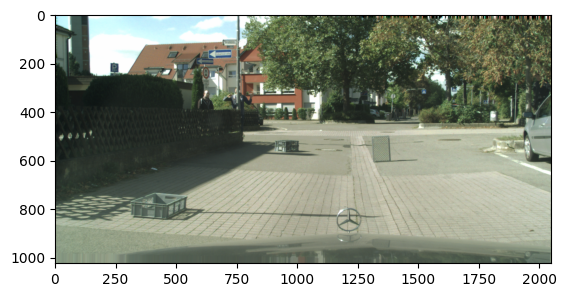

(2048, 1024) <class 'PIL.PngImagePlugin.PngImageFile'> 19


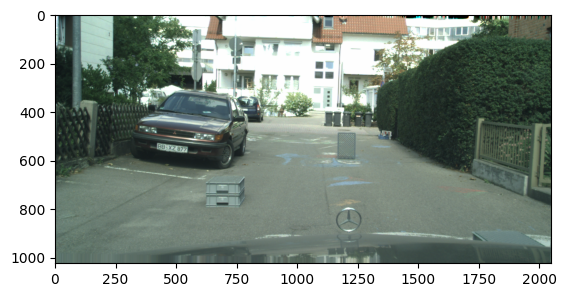

(2048, 1024) <class 'PIL.PngImagePlugin.PngImageFile'> 28


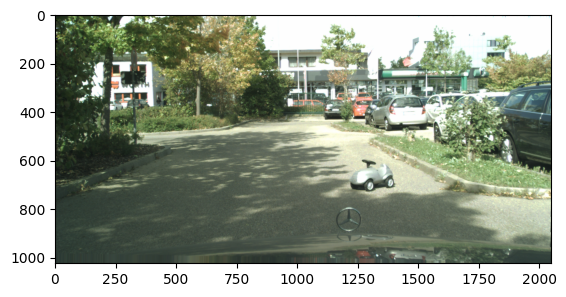

(2048, 1024) <class 'PIL.PngImagePlugin.PngImageFile'> 35


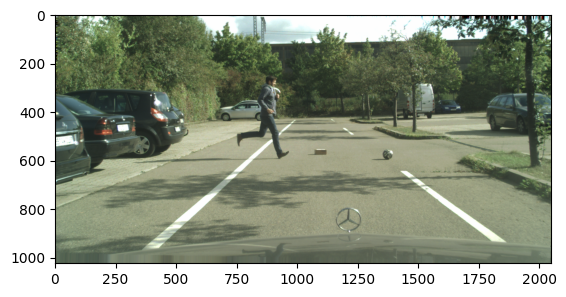

(2048, 1024) <class 'PIL.PngImagePlugin.PngImageFile'> 60


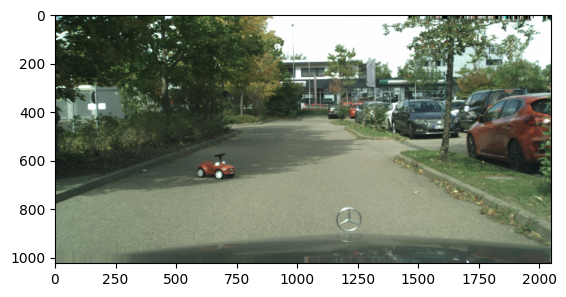

(2048, 1024) <class 'PIL.PngImagePlugin.PngImageFile'> 69


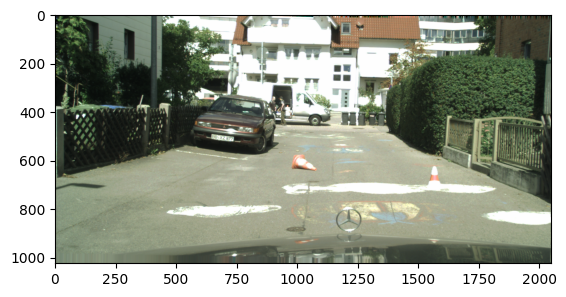

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

for i in range(len(lostandfound)):
    if i in [11, 19, 28, 35, 60, 69]:
        image = lostandfound[i]["image"]
        mask = lostandfound[i]["mask"]
        print(image.size, type(image), i)
        # Save the image
        image.save(f'lostandfound_{i}.png')  #
        mask.save(f'lostandfound_{i}_mask.png')
        plt.imshow(image)
        plt.show()

In [ ]:
from datasets import load_dataset

fishyscapes = load_dataset(split="data", path="BhavanaMalla/fishyscapes-semantic")

fishyscapes

Generating data split:   0%|          | 0/30 [00:00<?, ? examples/s]

Dataset({
    features: ['image', 'mask', 'image_name'],
    num_rows: 30
})

(2048, 1024) <class 'PIL.PngImagePlugin.PngImageFile'>


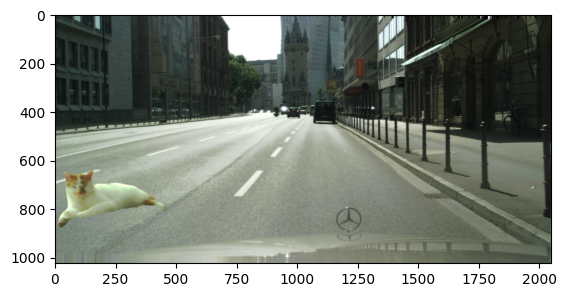

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

for i in range(len(fishyscapes)):
    if i == 18:
        image = fishyscapes[i]["image"]
        mask = fishyscapes[i]["mask"]
        print(image.size, type(image))
        # Save the image
        image.save('cat.png')
        mask.save(f'cat_mask.png')
        plt.imshow(image)
        plt.show()

In [ ]:
from datasets import load_dataset

anamoly = load_dataset(split="data", path="BhavanaMalla/anamoly_track")

anamoly

Generating data split:   0%|          | 0/10 [00:00<?, ? examples/s]

Dataset({
    features: ['image', 'mask', 'image_name'],
    num_rows: 10
})

(1280, 720) <class 'PIL.JpegImagePlugin.JpegImageFile'> 9


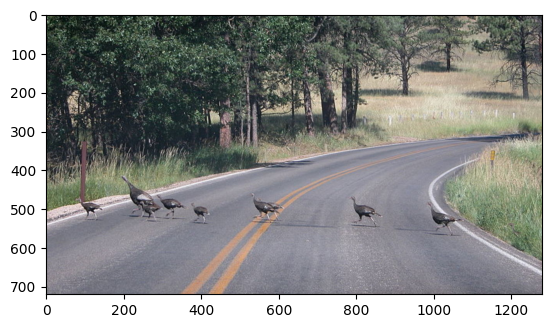

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

for i in range(len(anamoly)):
    if i == 9:
        image = anamoly[i]["image"]
        mask = anamoly[i]["mask"]
        print(image.size, type(image), i)
        # Save the image
        image.save(f'anamoly_{i}.png')
        mask.save(f'anamoly_{i}_mask.png')
        plt.imshow(image)
        plt.show()

In [ ]:
from datasets import load_dataset

obstacles = load_dataset(split="data", path="BhavanaMalla/obstacles_track")

obstacles

Generating data split:   0%|          | 0/30 [00:00<?, ? examples/s]

Dataset({
    features: ['image', 'mask', 'image_name'],
    num_rows: 30
})

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

for i in range(len(obstacles)):
    if i in [21, 24, 20, 2, 12, 22, 28]:
        image = obstacles[i]["image"]
        mask = obstacles[i]["mask"]
        print(image.size, type(image), i)
        # Save the image
        image.save(f'obstacle_{i}.png')
        mask.save(f'obstacle_{i}_mask.png')
        plt.imshow(image)
        plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
 SegMetrics: {'mean_iou': 0.8962430357933044, 'overall_accuracy': 0.942406415939331, 'mean_accuracy': 0.6071569919586182, 'nll': 0.4616833031177521,
              'per_category_iou': tensor([0.9785, 0.8156, 0.9009, 0.3434, 0.4730, 0.3475, 0.0077, 0.6011, 0.9096,
        0.6155, 0.9375, 0.7479, 0.0386, 0.9223, 0.1726, 0.3391, 0.2806, 0.0000,
        0.6381], device='cuda:0'),
              ,
              'per_category_entropy': tensor([0.4536, 0.4835, 0.4199, 0.9825, 0.7618, 0.9929, 0.9993, 0.7984, 0.4164,
        0.6146, 0.4210, 0.6071, 0.9992, 0.4229, 0.9986, 0.9984, 0.9983, 0.0000,
        0.7424], device='cuda:0'),
              'per_category_mcd_unc': None, 'per_category_edl_belief': None, 'per_category_edl_unc': None,
              }

In [ ]:
import torch

per_category_freq = torch.Tensor([4.5670e-01, 4.7880e-02, 1.9845e-01, 3.9525e-03, 6.0264e-03, 6.6815e-03,
        1.4095e-05, 6.2323e-03, 1.5568e-01, 6.3080e-03, 3.0061e-02, 1.1641e-02,
        9.0428e-05, 5.8743e-02, 7.0341e-04, 2.0721e-03, 1.2705e-03, 0.0000e+00,
        7.4992e-03])
per_category_accuracy = torch.Tensor([0.9916, 0.9043, 0.9649, 0.4133, 0.5907, 0.3910, 0.0077, 0.7769, 0.9664,
        0.7115, 0.9806, 0.8672, 0.0390, 0.9743, 0.1865, 0.4076, 0.5019, 0.0000,
        0.8607])
class_labels = [
        "road", "sidewalk", "building", "wall", "fence",
        "pole", "traffic_light", "traffic_sign", "vegetation", "terrain",
        "sky", "person", "rider", "car", "truck", "bus", "train",
        "motorcycle", "bicycle"
    ]

In [ ]:
import numpy as np
import plotly.graph_objects as go
from typing import List

def plot_per_class_metrics(per_cls_metric1, per_cls_metric2, metric1_title: str, metric2_title: str, class_labels: List[str]):
    """
    Plot the Per Category Metrics as a scatter plot for a test set.

    For example:
    - Per Class Entropy vs Per Class Frequency
    - Per Class Uncertainty vs Per Class Frequency
    - Per Class Entropy vs Per Class Accuracy
    - Per Class Uncertainty vs Per Class Frequency
    """
    per_cls_metric1 = per_cls_metric1.cpu()
    per_cls_metric2 = per_cls_metric2.cpu()
    # FIXME: Adjust xaxis and yaxis
    fig = go.Figure(data=go.Scatter(x=per_cls_metric1, y=per_cls_metric2, mode='markers+text', text=class_labels, textposition='bottom right',  textfont=dict(size=10)))
    fig.update_layout(title=f'{metric1_title} vs. {metric2_title}', xaxis_title=f'{metric1_title}', yaxis_title=f'{metric2_title}')
    return fig

In [ ]:
import torch

per_category_freq = torch.Tensor([4.5670e-01, 4.7880e-02, 1.9845e-01, 3.9525e-03, 6.0264e-03, 6.6815e-03,
        1.4095e-05, 6.2323e-03, 1.5568e-01, 6.3080e-03, 3.0061e-02, 1.1641e-02,
        9.0428e-05, 5.8743e-02, 7.0341e-04, 2.0721e-03, 1.2705e-03, 0.0000e+00,
        7.4992e-03])
per_category_accuracy = torch.Tensor([0.9916, 0.9043, 0.9649, 0.4133, 0.5907, 0.3910, 0.0077, 0.7769, 0.9664,
        0.7115, 0.9806, 0.8672, 0.0390, 0.9743, 0.1865, 0.4076, 0.5019, 0.0000,
        0.8607])
class_labels = [
        "road", "sidewalk", "building", "wall", "fence",
        "pole", "traffic_light", "traffic_sign", "vegetation", "terrain",
        "sky", "person", "rider", "car", "truck", "bus", "train",
        "motorcycle", "bicycle"
    ]

plot_per_class_metrics(per_category_accuracy, per_category_freq, metric1_title="accuracy", metric2_title="frequency", class_labels=class_labels)

In [ ]:
import plotly.graph_objects as go
import numpy as np
from typing import List

def check_overlap(label_pos, existing_labels, margin=0.05):
    """
    Check if a new label position overlaps with any existing label positions.
    If overlap is detected, return True; otherwise, return False.
    """
    for ex_label_pos in existing_labels:
        if np.abs(label_pos[0] - ex_label_pos[0]) < margin and np.abs(label_pos[1] - ex_label_pos[1]) < margin:
            return True
    return False

def plot_per_class_metrics_dynamic_labels(per_cls_metric1, per_cls_metric2, metric1_title: str, metric2_title: str, class_labels: List[str]):
    per_cls_metric1 = per_cls_metric1.cpu().numpy()
    per_cls_metric2 = per_cls_metric2.cpu().numpy()

    fig = go.Figure(
        data=go.Scatter(
            x=per_cls_metric1,
            y=per_cls_metric2,
            mode='markers',
            marker=dict(size=10),
            text=class_labels,
            hoverinfo='text'
        )
    )

    existing_labels = []

    for i, label in enumerate(class_labels):
        x = per_cls_metric1[i]
        y = per_cls_metric2[i]
        above = (x, y + 0.02)  # Try positioning above the point
        below = (x, y - 0.02)  # Alternative position below the point

        # Check for overlap if placing above
        if check_overlap(above, existing_labels):
            # If overlap, place below
            fig.add_annotation(
                x=x,
                y=y,
                text=label,
                showarrow=False,
                yshift=-10  # Shift text downwards
            )
            existing_labels.append(below)
        else:
            # No overlap, place above
            fig.add_annotation(
                x=x,
                y=y,
                text=label,
                showarrow=False,
                yshift=10  # Shift text upwards
            )
            existing_labels.append(above)

    fig.update_layout(
        title=f'{metric1_title} vs. {metric2_title}',
        xaxis_title=f'{metric1_title}',
        yaxis_title=f'{metric2_title}',
        plot_bgcolor='rgb(240, 240, 240)',
        height=600,
        width=1200
    )

    return fig

# Call the plotting function
fig = plot_per_class_metrics_dynamic_labels(
    per_category_accuracy, per_category_freq,
    metric1_title="accuracy", metric2_title="frequency",
    class_labels=class_labels
)

fig.show()


In [ ]:
import plotly.graph_objects as go
import numpy as np
from typing import List

def calculate_distances(points):
    """Calculate the distance between each point."""
    dist_matrix = np.linalg.norm(points[:, np.newaxis] - points, axis=2)
    return dist_matrix

def plot_per_class_metrics_dynamic_labels(per_cls_metric1, per_cls_metric2, metric1_title: str, metric2_title: str, class_labels: List[str], threshold=0.05):
    per_cls_metric1 = per_cls_metric1.cpu().numpy()
    per_cls_metric2 = per_cls_metric2.cpu().numpy()

    points = np.column_stack((per_cls_metric1, per_cls_metric2))
    distances = calculate_distances(points)

    fig = go.Figure(
        data=go.Scatter(
            x=per_cls_metric1,
            y=per_cls_metric2,
            mode='markers',
            marker=dict(size=10),
            text=class_labels,
            hoverinfo='text+x+y',  # Include text, x, and y values in the hover info
            hovertemplate='<b>%{text}</b><br>x: %{x}<br>y: %{y}<extra></extra>',
            textfont=dict(size=1)
        )
    )

    used_positions = []

    for i, (x, y) in enumerate(points):
        label_pos_above = (x, y + 0.02)
        label_pos_below = (x, y - 0.02)

        # Check if there are any close points
        close_points = np.where((distances[i] < threshold) & (distances[i] > 0))[0]

        if len(close_points) > 0:
            # If the point is close to others, check if it's above or below the closest point
            closest_point_idx = close_points[np.argmin(distances[i, close_points])]
            if y < points[closest_point_idx, 1]:
                fig.add_annotation(
                    x=x, y=y,
                    text=class_labels[i],
                    showarrow=False,
                    yshift=10
                )
                used_positions.append(label_pos_above)
            else:
                fig.add_annotation(
                    x=x, y=y,
                    text=class_labels[i],
                    showarrow=False,
                    yshift=-10
                )
                used_positions.append(label_pos_below)
        else:
            # If there are no close points, place the label above
            fig.add_annotation(
                x=x, y=y,
                text=class_labels[i],
                showarrow=False,
                yshift=10
            )
            used_positions.append(label_pos_above)

    fig.update_layout(
        title=f'{metric1_title} vs. {metric2_title}',
        xaxis_title=f'{metric1_title}',
        yaxis_title=f'{metric2_title}',
        plot_bgcolor='rgb(240, 240, 240)',
        height=600,
        width=1200
    )

    return fig

# Example usage
fig = plot_per_class_metrics_dynamic_labels(
    per_category_accuracy, per_category_freq,
    metric1_title="accuracy", metric2_title="frequency",
    class_labels=class_labels,
    threshold=0.05  # Adjust this value to change sensitivity to close points
)

fig.show()


In [ ]:
import torch

per_category_entropy = torch.Tensor([0.4536, 0.4835, 0.4199, 0.9825, 0.7618, 0.9929, 0.9993, 0.7984, 0.4164,
        0.6146, 0.4210, 0.6071, 0.9992, 0.4229, 0.9986, 0.9984, 0.9983, 0.0000,
        0.7424])
per_category_accuracy = torch.Tensor([0.9916, 0.9043, 0.9649, 0.4133, 0.5907, 0.3910, 0.0077, 0.7769, 0.9664,
        0.7115, 0.9806, 0.8672, 0.0390, 0.9743, 0.1865, 0.4076, 0.5019, 0.0000,
        0.8607])
class_labels = [
        "road", "sidewalk", "building", "wall", "fence",
        "pole", "traffic_light", "traffic_sign", "vegetation", "terrain",
        "sky", "person", "rider", "car", "truck", "bus", "train",
        "motorcycle", "bicycle"
    ]

# Example usage
fig = plot_per_class_metrics_dynamic_labels(
    per_category_accuracy,
    per_category_entropy,
    metric1_title="accuracy", metric2_title="entropy",
    class_labels=class_labels,
    threshold=0.05  # Adjust this value to change sensitivity to close points
)

fig.show()


In [ ]:
import torch

per_category_iou = torch.Tensor([0.9785, 0.8156, 0.9009, 0.3434, 0.4730, 0.3475, 0.0077, 0.6011, 0.9096,
        0.6155, 0.9375, 0.7479, 0.0386, 0.9223, 0.1726, 0.3391, 0.2806, 0.0000,
        0.6381])
per_category_accuracy = torch.Tensor([0.9916, 0.9043, 0.9649, 0.4133, 0.5907, 0.3910, 0.0077, 0.7769, 0.9664,
        0.7115, 0.9806, 0.8672, 0.0390, 0.9743, 0.1865, 0.4076, 0.5019, 0.0000,
        0.8607])
class_labels = [
        "road", "sidewalk", "building", "wall", "fence",
        "pole", "traffic_light", "traffic_sign", "vegetation", "terrain",
        "sky", "person", "rider", "car", "truck", "bus", "train",
        "motorcycle", "bicycle"
    ]

# Example usage
fig = plot_per_class_metrics_dynamic_labels(
    per_category_accuracy,
    per_category_iou,
    metric1_title="accuracy", metric2_title="iou",
    class_labels=class_labels,
    threshold=0.05  # Adjust this value to change sensitivity to close points
)

fig.show()


In [ ]:
import torch

per_category_iou = torch.Tensor([0.9785, 0.8156, 0.9009, 0.3434, 0.4730, 0.3475, 0.0077, 0.6011, 0.9096,
        0.6155, 0.9375, 0.7479, 0.0386, 0.9223, 0.1726, 0.3391, 0.2806, 0.0000,
        0.6381])
per_category_entropy = torch.Tensor([0.4536, 0.4835, 0.4199, 0.9825, 0.7618, 0.9929, 0.9993, 0.7984, 0.4164,
        0.6146, 0.4210, 0.6071, 0.9992, 0.4229, 0.9986, 0.9984, 0.9983, 0.0000,
        0.7424])
class_labels = [
        "road", "sidewalk", "building", "wall", "fence",
        "pole", "traffic_light", "traffic_sign", "vegetation", "terrain",
        "sky", "person", "rider", "car", "truck", "bus", "train",
        "motorcycle", "bicycle"
    ]

# Example usage
fig = plot_per_class_metrics_dynamic_labels(
    per_category_iou,
    per_category_entropy,
    metric1_title="iou", metric2_title="entropy",
    class_labels=class_labels,
    threshold=0.05  # Adjust this value to change sensitivity to close points
)

fig.show()

In [ ]:
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!cp /content/drive/MyDrive/Colab\ Notebooks/Master\ Thesis/Results/cityscapes/FPN_MITB3/PerImageResults/per_image_test_results_FPN_MIT_B3_baseline_cityscapes_t7z5h2i.csv .

In [ ]:
import pandas as pd
import plotly.express as px

# Load the CSV file
df = pd.read_csv('/content/per_image_test_results_FPN_MIT_B3_baseline_cityscapes_t7z5h2i.csv')

# Create a long-form DataFrame for Plotly
df_long = pd.melt(df, id_vars=['test_img_names'], value_vars=['test_IoUs'],
                  var_name='Metric', value_name='Value')

# Create the box plot with hover information
fig = px.violin(df_long, x='Metric', y='Value', points='all', hover_data=['test_img_names'])

# Customize the layout
fig.update_layout(
    title="Box Plot of Metrics per Test Image with Hover Info",
    yaxis_title="Metric Values",
    xaxis_title="Metric"
)

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Load the CSV file
df = pd.read_csv('/content/per_image_test_results_FPN_MIT_B3_baseline_cityscapes_t7z5h2i.csv')

# Create a long-form DataFrame for Plotly
df_long = pd.melt(df, id_vars=['test_img_names'], value_vars=['test_accs'],
                  var_name='Metric', value_name='Value')

# Create the box plot with hover information
fig = px.violin(df_long, x='Metric', y='Value', points='all', hover_data=['test_img_names'])

# Customize the layout
fig.update_layout(
    title="Box Plot of Metrics per Test Image with Hover Info",
    yaxis_title="Metric Values",
    xaxis_title="Metric"
)

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Load the CSV file
df = pd.read_csv('/content/per_image_test_results_FPN_MIT_B3_baseline_cityscapes_t7z5h2i.csv')

# Create a long-form DataFrame for Plotly
df_long = pd.melt(df, id_vars=['test_img_names'], value_vars=['test_eces'],
                  var_name='Metric', value_name='Value')

# Create the box plot with hover information
fig = px.violin(df_long, x='Metric', y='Value', points='all', hover_data=['test_img_names'])

# Customize the layout
fig.update_layout(
    title="Box Plot of Metrics per Test Image with Hover Info",
    yaxis_title="Metric Values",
    xaxis_title="Metric"
)

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Load the CSV file
df = pd.read_csv('/content/per_image_test_results_FPN_MIT_B3_baseline_cityscapes_t7z5h2i.csv')

# Exclude the 'test_img_names' column and loop through the remaining metric columns
metrics = [col for col in df.columns if col != 'test_img_names']

# Loop through each metric column
for metric in metrics:
    # Create a long-form DataFrame for the current metric
    df_long = pd.melt(df, id_vars=['test_img_names'], value_vars=[metric],
                    var_name='Metric', value_name='Value')

    # Create the violin plot with hover information
    fig = px.violin(df_long, x='Metric', y='Value', points='all', hover_data=['test_img_names'], box=True)

    # Customize the layout
    fig.update_layout(
        title=f"{metric} per Test Image",
        yaxis_title=f"{metric}",
        # xaxis_title="Metric"
    )
    fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Load the CSV file
df = pd.read_csv('/content/per_image_test_results_FPN_MIT_B3_baseline_cityscapes_t7z5h2i.csv')

# Exclude the 'test_img_names' column and create a long-form DataFrame
metrics = [col for col in df.columns if col != 'test_img_names']

# Create a long-form DataFrame for all metrics
df_long = pd.melt(df, id_vars=['test_img_names'], value_vars=metrics,
                  var_name='Metric', value_name='Value')

# Create a horizontal violin plot with all metrics in the same plot
fig = px.violin(df_long, y='Metric', x='Value', points='all', hover_data=['test_img_names'], orientation='h')

# Customize the layout
fig.update_layout(
    title="Combined Violin Plot of All Metrics per Test Image",
    xaxis_title="Metric Values",
    yaxis_title="Metric"
)

# Display the plot
fig.show()


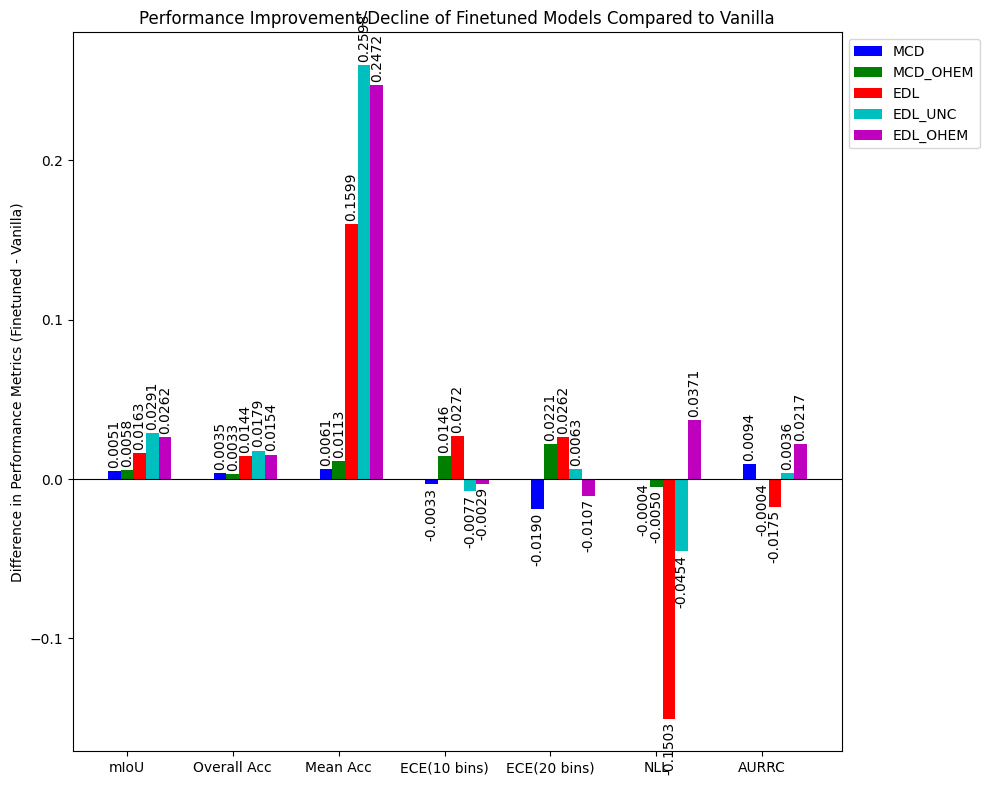

In [12]:
import matplotlib.pyplot as plt
import numpy as np

# Example data for vanilla and finetuned models
metrics = ['mIoU', 'Overall Acc', 'Mean Acc', 'ECE(10 bins)', 'ECE(20 bins)', 'NLL', 'AURRC']
vanilla_values = {
    'Baseline': [0.92728, 0.96086, 0.86243, 0.28212, 0.34658, 0.13978, 0.1834],
    'MCD': [0.92425, 0.95871, 0.85908, 0.29189, 0.36996, 0.13792, 0.16782],
    'MCD_OHEM': [0.92428, 0.95919, 0.85647, 0.26691, 0.32431, 0.14036, 0.18388],
    'EDL': [0.90598, 0.94271, 0.69591, 0.12871, 0.13319, 0.52859, 0.19388],
    'EDL_UNC': [0.8947, 0.94077, 0.59661, 0.11722, 0.13406, 0.48002, 0.16999],
    'EDL_OHEM': [0.89624, 0.94241, 0.60716, 0.11322, 0.12693, 0.46168, 0.1949]
}
finetuned_values = {
    'MCD': [0.92933, 0.96218, 0.86515, 0.28854, 0.35098, 0.13753, 0.17724],
    'MCD_OHEM': [0.93004, 0.96251, 0.86777, 0.2815, 0.34638, 0.13538, 0.18343],
    'EDL': [0.92228, 0.95716, 0.85585, 0.15594, 0.15941, 0.37824, 0.17636],
    'EDL_UNC': [0.92376, 0.95865, 0.85645, 0.10954, 0.14032, 0.43466, 0.17357],
    'EDL_OHEM': [0.92242, 0.95778, 0.85436, 0.11035, 0.11625, 0.49873, 0.21661]
}

# Calculate the differences
differences = {}
for model in finetuned_values.keys():
    differences[model] = np.array(finetuned_values[model]) - np.array(vanilla_values[model])

# Define color for each model
colors = ['b', 'g', 'r', 'c', 'm', 'y']

# Create figure and axes
fig, ax = plt.subplots(figsize=(10, 8))
x = np.arange(len(metrics))  # the label locations
width = 0.12  # the width of the bars

# Plot the difference bars
for i, (model, color) in enumerate(zip(differences.keys(), colors)):
    diff_values = differences[model]
    ax.bar(x + i*width, diff_values, width, label=model, color=color)
    for j, val in enumerate(diff_values):
        if val >= 0:
            ax.text(x[j] + i*width, val + 0.002, f'{val:.4f}', ha='center', va='bottom', rotation=90)
        else:
            ax.text(x[j] + i*width, val - 0.002, f'{val:.4f}', ha='center', va='top', rotation=90)

# Draw horizontal line at y=0
ax.axhline(0, color='black',linewidth=0.8)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Difference in Performance Metrics (Finetuned - Vanilla)')
ax.set_title('Performance Improvement/Decline of Finetuned Models Compared to Vanilla')
ax.set_xticks(x + width)
ax.set_xticklabels(metrics)
ax.legend(loc='upper left', bbox_to_anchor=(1,1))

fig.tight_layout()

plt.show()


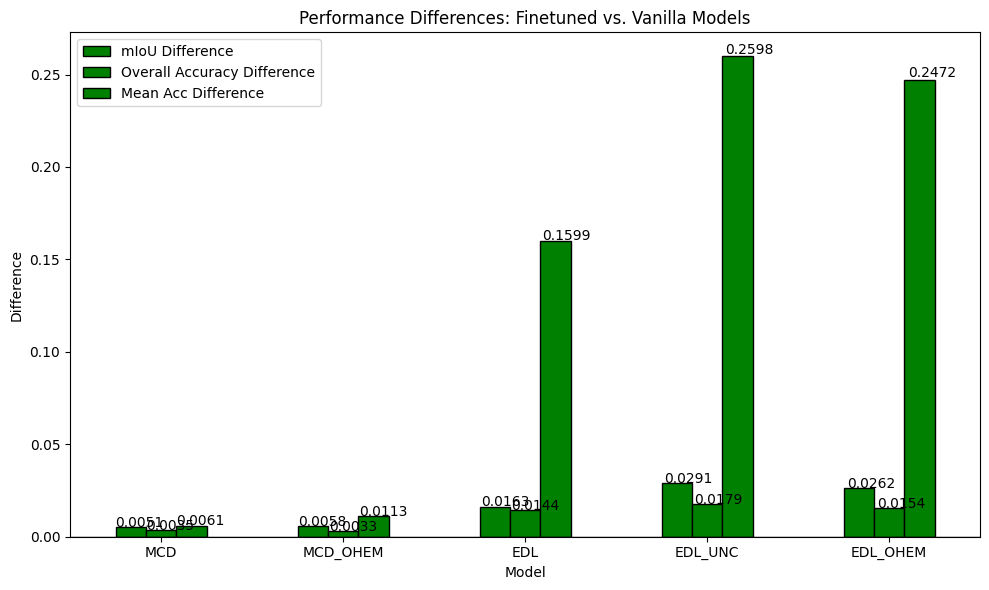

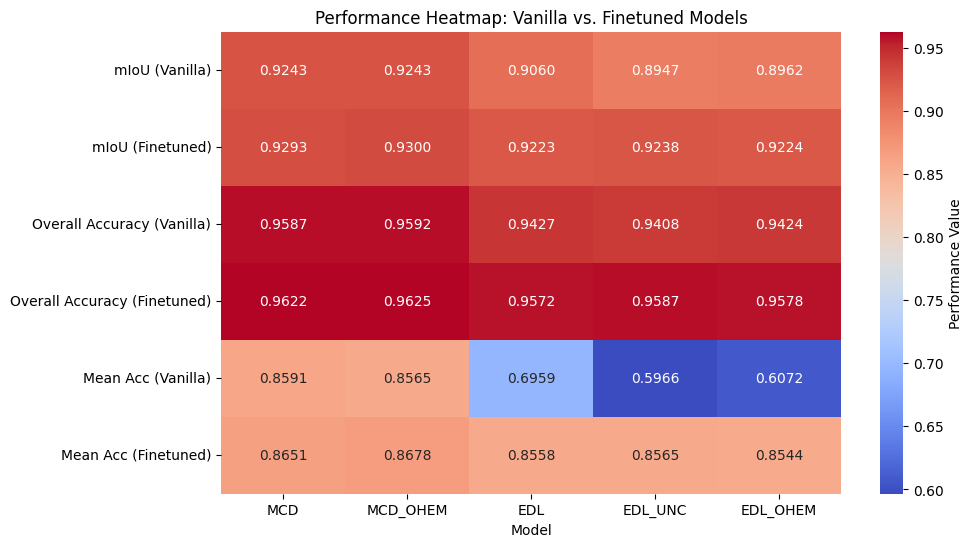

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Sample data: Replace this with your actual data
data = {
    'Model': ['MCD', 'MCD_OHEM', 'EDL', 'EDL_UNC', 'EDL_OHEM'],
    'mIoU (Vanilla)': [0.92425, 0.92428, 0.90598, 0.89470, 0.89624],
    'mIoU (Finetuned)': [0.92933, 0.93004, 0.92228, 0.92376, 0.92242],
    'Overall Accuracy (Vanilla)': [0.95871, 0.95919, 0.94271, 0.94077, 0.94241],
    'Overall Accuracy (Finetuned)': [0.96218, 0.96251, 0.95716, 0.95865, 0.95778],
    'Mean Acc (Vanilla)': [0.85908, 0.85647, 0.69591, 0.59661, 0.60716],
    'Mean Acc (Finetuned)': [0.86515, 0.86777, 0.85585, 0.85645, 0.85436],
}

# Convert to DataFrame
df = pd.DataFrame(data)

# Calculate the differences
df['mIoU Difference'] = df['mIoU (Finetuned)'] - df['mIoU (Vanilla)']
df['Overall Accuracy Difference'] = df['Overall Accuracy (Finetuned)'] - df['Overall Accuracy (Vanilla)']
df['Mean Acc Difference'] = df['Mean Acc (Finetuned)'] - df['Mean Acc (Vanilla)']

# Plotting the Difference Bar Chart
fig, ax = plt.subplots(1, 1, figsize=(10, 6))

# Metrics to plot
metrics = ['mIoU Difference', 'Overall Accuracy Difference', 'Mean Acc Difference']
colors = ['green' if value >= 0 else 'red' for value in np.concatenate([df[metric].values for metric in metrics])]

# Plot each metric
df.plot(x='Model', y=metrics, kind='bar', ax=ax, color=colors, edgecolor='black')

# Draw a horizontal line at y=0 for reference
plt.axhline(0, color='black', linewidth=1)

# Set labels and title
ax.set_ylabel('Difference')
ax.set_title('Performance Differences: Finetuned vs. Vanilla Models')

# Annotate bars with the difference value
for p in ax.patches:
    ax.annotate(f'{p.get_height():.4f}', (p.get_x() * 1.005, p.get_height() * 1.005))

plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# Plotting the Heatmap
# Combine vanilla and finetuned data
heatmap_data = df[['Model', 'mIoU (Vanilla)', 'mIoU (Finetuned)',
                   'Overall Accuracy (Vanilla)', 'Overall Accuracy (Finetuned)',
                   'Mean Acc (Vanilla)', 'Mean Acc (Finetuned)']]

# Set index to Model for better readability in heatmap
heatmap_data.set_index('Model', inplace=True)

# Plotting the Heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data.T, annot=True, fmt=".4f", cmap='coolwarm', cbar_kws={'label': 'Performance Value'})
plt.title('Performance Heatmap: Vanilla vs. Finetuned Models')
plt.show()
